# Telecom Churn Prediction Case Study

### Step 1: Reading Data

In [1]:
#Importing Required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing IMBLearn

!pip install imblearn

In [3]:
#Imprting ML (Scikit Learn and IMBLearn) Packages

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn import metrics
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.linear_model import LogisticRegression
from imblearn.metrics import sensitivity_specificity_support
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix

In [4]:
#Reading Telecom Churn Data

telecom_churn_data=pd.read_csv('telecom_churn_data.csv')
telecom_churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [5]:
# Chekcing shape of dataframe

telecom_churn_data.shape

(99999, 226)

In [6]:
# Getting Information

telecom_churn_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [7]:
# CHekcing Null Values

telecom_null = (telecom_churn_data.isnull().sum().sort_values(ascending=False)/ len(telecom_churn_data)) * 100

In [8]:
# Filtering columns having Null Values more than 70%

telecom_null_data_70_percent = telecom_null[telecom_null > 70].sort_values(ascending=False)

In [9]:
telecom_null_data_70_percent

arpu_3g_6                   74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
night_pck_user_6            74.846748
count_rech_2g_7             74.428744
arpu_3g_7                   74.428744
count_rech_3g_7             74.428744
arpu_2g_7                   74.428744
av_rech_amt_data_7          74.428744
fb_user_7                   74.428744
night_pck_user_7            74.428744
max_rech_data_7             74.428744
total_rech_data_7           74.428744
date_of_last_rech_data_7    74.428744
date_of_last_rech_data_9    74.077741
av_rech_amt_data_9          74.077741
count_rech_2g_9             74.077741
arpu_2g_9                   74.077741
night_pck_user_9            74.077741
total_rech_data_9           74.077741
arpu_3g_9   

In churn prediction, we assume that there are three phases of customer lifecycle :
<ul>
<li>The ‘good’ phase : Month 6th and 7th </li>  
<li>The ‘action’ phase : 8th Month</li>  
<li>The ‘churn’ phase  : 9th Month</li>
</ul>



#### Deriving New Features

In [10]:
# Filtering the columns having recharge amount and recharge data

telecom_amt_rech_cols = telecom_churn_data.columns[telecom_churn_data.columns.str.contains('rech_amt|rech_data')]

telecom_amt_rech_cols

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'date_of_last_rech_data_6',
       'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
       'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'av_rech_amt_data_9'],
      dtype='object')

In [11]:
# checking the null values

telecom_null_data = (telecom_churn_data.loc[:,telecom_amt_rech_cols].isnull().sum().sort_values(ascending=False)/len(telecom_churn_data))* 100

In [12]:
telecom_null_data

total_rech_data_6           74.846748
av_rech_amt_data_6          74.846748
max_rech_data_6             74.846748
date_of_last_rech_data_6    74.846748
av_rech_amt_data_7          74.428744
max_rech_data_7             74.428744
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
date_of_last_rech_data_9    74.077741
max_rech_data_9             74.077741
total_rech_data_9           74.077741
av_rech_amt_data_9          74.077741
date_of_last_rech_data_8    73.660737
total_rech_data_8           73.660737
max_rech_data_8             73.660737
av_rech_amt_data_8          73.660737
total_rech_amt_7             0.000000
max_rech_amt_9               0.000000
max_rech_amt_8               0.000000
max_rech_amt_7               0.000000
max_rech_amt_6               0.000000
total_rech_amt_9             0.000000
total_rech_amt_8             0.000000
total_rech_amt_6             0.000000
dtype: float64

In [13]:
# Replace null value with 0 for Total Recharge Data in June,July August and September

telecom_churn_data['total_rech_data_6'] = telecom_churn_data['total_rech_data_6'].replace(np.NaN,0.0)

telecom_churn_data['total_rech_data_7'] = telecom_churn_data['total_rech_data_7'].replace(np.NaN,0.0)

telecom_churn_data['total_rech_data_8'] = telecom_churn_data['total_rech_data_8'].replace(np.NaN,0.0)

telecom_churn_data['total_rech_data_9'] = telecom_churn_data['total_rech_data_9'].replace(np.NaN,0.0)

In [14]:
# Replace null value with 0 for Average Recharge Data in June,July August and September

telecom_churn_data['av_rech_amt_data_6'] = telecom_churn_data['av_rech_amt_data_6'].replace(np.NaN,0.0)

telecom_churn_data['av_rech_amt_data_7'] = telecom_churn_data['av_rech_amt_data_7'].replace(np.NaN,0.0)

telecom_churn_data['av_rech_amt_data_8'] = telecom_churn_data['av_rech_amt_data_8'].replace(np.NaN,0.0)

telecom_churn_data['av_rech_amt_data_9'] = telecom_churn_data['av_rech_amt_data_9'].replace(np.NaN,0.0)

In [15]:
# Chekcing null values for telecom amount recharge columns

(telecom_churn_data.loc[:,telecom_amt_rech_cols].isnull().sum().sort_values(ascending=False)/len(telecom_churn_data))* 100

date_of_last_rech_data_6    74.846748
max_rech_data_6             74.846748
max_rech_data_7             74.428744
date_of_last_rech_data_7    74.428744
max_rech_data_9             74.077741
date_of_last_rech_data_9    74.077741
max_rech_data_8             73.660737
date_of_last_rech_data_8    73.660737
total_rech_amt_6             0.000000
total_rech_data_8            0.000000
av_rech_amt_data_8           0.000000
av_rech_amt_data_7           0.000000
av_rech_amt_data_6           0.000000
total_rech_data_9            0.000000
total_rech_data_6            0.000000
total_rech_data_7            0.000000
total_rech_amt_7             0.000000
max_rech_amt_9               0.000000
max_rech_amt_8               0.000000
max_rech_amt_7               0.000000
max_rech_amt_6               0.000000
total_rech_amt_9             0.000000
total_rech_amt_8             0.000000
av_rech_amt_data_9           0.000000
dtype: float64

**Creating New Feature**

In [16]:
# Total recharge data for June
telecom_churn_data['total_data_rech_amt_6'] = telecom_churn_data['total_rech_data_6'] * telecom_churn_data['av_rech_amt_data_6']

# Total recharge data for July
telecom_churn_data['total_data_rech_amt_7'] = telecom_churn_data['total_rech_data_7'] * telecom_churn_data['av_rech_amt_data_7']

# Total recharge data for August
telecom_churn_data['total_data_rech_amt_8'] = telecom_churn_data['total_rech_data_8'] * telecom_churn_data['av_rech_amt_data_8']

# Total recharge data for September
telecom_churn_data['total_data_rech_amt_9'] = telecom_churn_data['total_rech_data_9'] * telecom_churn_data['av_rech_amt_data_9']

In [17]:
## Filtering High Value Customer

for colz in ('total_data_rech_amt_6',
            'total_data_rech_amt_7',
            'total_data_rech_amt_8',
            'total_data_rech_amt_9'):
    print(colz)
    print('****')
    print((telecom_churn_data[colz].value_counts()/len(telecom_churn_data[colz]))*100)
    print('----------------------------------------')
    print(colz)
    print('****')
    print(telecom_churn_data[colz].describe())
    print('######################################')

total_data_rech_amt_6
****
0.0        74.846748
154.0       3.710037
252.0       1.838018
198.0       1.049010
25.0        0.957010
             ...    
12100.0     0.001000
2259.0      0.001000
1447.5      0.001000
7872.0      0.001000
4147.0      0.001000
Name: total_data_rech_amt_6, Length: 1689, dtype: float64
----------------------------------------
total_data_rech_amt_6
****
count     99999.000000
mean        148.883796
std         804.258761
min           0.000000
25%           0.000000
50%           0.000000
75%          13.000000
max      105644.000000
Name: total_data_rech_amt_6, dtype: float64
######################################
total_data_rech_amt_7
****
0.0        74.428744
154.0       3.674037
252.0       1.821018
198.0       1.147011
25.0        0.823008
             ...    
106.5       0.001000
1845.0      0.001000
15390.0     0.001000
1812.0      0.001000
305.0       0.001000
Name: total_data_rech_amt_7, Length: 1790, dtype: float64
---------------------------------

### Step 2: Preparing Data

### Filter High Value Customer

In [18]:
# Adding data of total data recharge amount and total recharge amount 

telecom_churn_data['total_rech_6'] = telecom_churn_data['total_data_rech_amt_6'] + telecom_churn_data['total_rech_amt_6']
telecom_churn_data['total_rech_7'] = telecom_churn_data['total_data_rech_amt_7'] + telecom_churn_data['total_rech_amt_7']
telecom_churn_data['total_rech_8'] = telecom_churn_data['total_data_rech_amt_8'] + telecom_churn_data['total_rech_amt_8']
telecom_churn_data['total_rech_9'] = telecom_churn_data['total_data_rech_amt_9'] + telecom_churn_data['total_rech_amt_9']

In [19]:
# checking mean value of total recharge done in june and july

telecom_churn_data['total_rech_6_7'] = telecom_churn_data['total_rech_6'] + telecom_churn_data['total_rech_7']
print("Mean Value : ",round(telecom_churn_data['total_rech_6_7'].mean(), 2))

Mean Value :  970.66


In [20]:
# Checking the 71 percentile value for total recharge done in june and july

print("70% of recharge : ",telecom_churn_data['total_rech_6_7'].quantile(0.7))

70% of recharge :  956.0


In [21]:
#Defining high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months

telecom_churn_data = telecom_churn_data[(telecom_churn_data['total_rech_6_7'] >= telecom_churn_data['total_rech_6_7'].quantile(0.7))]

In [22]:
#checking shape after 70%

telecom_churn_data.shape

(30001, 235)

In [23]:
telecom_churn_data = telecom_churn_data.reset_index(drop=True)
telecom_churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sep_vbc_3g,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_data_rech_amt_9,total_rech_6,total_rech_7,total_rech_8,total_rech_9,total_rech_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,3.58,252.0,252.0,252.0,0.0,614.0,504.0,504.0,0.0,1118.0
1,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,...,0.00,0.0,0.0,0.0,0.0,1580.0,790.0,3638.0,0.0,2370.0
2,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,...,0.00,0.0,354.0,207.0,0.0,437.0,955.0,327.0,186.0,1392.0
3,7002124215,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,514.453,...,0.00,0.0,0.0,0.0,0.0,600.0,680.0,718.0,680.0,1280.0
4,7000887461,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,74.350,...,0.00,0.0,712.0,540.0,252.0,0.0,1166.0,979.0,504.0,1166.0


In [24]:
## Renaming Columns

telecom_churn_data.rename(columns = {'jun_vbc_3g' : 'vbc_3g_6',
                                    'jul_vbc_3g' : 'vbc_3g_7',
                                    'aug_vbc_3g' : 'vbc_3g_8',
                                    'sep_vbc_3g' : 'vbc_3g_9',},inplace=True)

In [25]:
# Checking telecom churn parameters

telecom_churn_params = telecom_churn_data[['total_ic_mou_9' ,'total_og_mou_9','vol_2g_mb_9' ,'vol_3g_mb_9' ]]

telecom_churn_params.head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
0,0.00,0.00,0.00,0.00
1,0.00,0.00,0.00,0.00
2,34.91,142.18,0.00,0.00
3,252.61,1031.53,0.00,0.00
4,127.48,127.63,13.93,314.74


In [26]:
#Looking at the statistical aspects of the dataframe

telecom_churn_params.describe()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
count,30001.000000,30001.000000,30001.000000,30001.000000
mean,264.901497,500.869219,91.435910,349.513848
std,358.290694,666.902007,282.370006,947.079372
min,0.000000,0.000000,0.000000,0.000000
25%,50.480000,47.640000,0.000000,0.000000
50%,157.980000,284.940000,0.000000,0.000000
75%,343.540000,698.680000,38.000000,320.610000
max,7785.730000,11517.730000,8993.950000,39221.270000


 creating churn column based on condition 
 
 if incoming call, outgoing call, 2G and 3G data consumption is 0 then **churn** is confirmed otherwise it is **no churn**


In [27]:
#Creating churn column based on condition (Churn --> 1 , Not Churn --> 0)

telecom_churn_data['Churn'] = telecom_churn_data.apply(lambda x: 1 if (x.total_ic_mou_9==0) and (x.total_og_mou_9==0) and (x.vol_2g_mb_9 ==0) and (x.vol_3g_mb_9 ==0) else 0 , axis = 1)

In [28]:
# Comparing churn with september columns

pd.set_option('display.max_rows',None)
telecom_churn_data[['mobile_number','total_ic_mou_9' ,'total_og_mou_9','vol_2g_mb_9' ,'vol_3g_mb_9' ,'Churn']]

,mobile_number,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,Churn
0,7000842753,0.00,0.00,0.00,0.00,1
1,7000701601,0.00,0.00,0.00,0.00,1
2,7001524846,34.91,142.18,0.00,0.00,0
3,7002124215,252.61,1031.53,0.00,0.00,0
4,7000887461,127.48,127.63,13.93,314.74,0
5,7000149764,114.16,1.70,30.92,5588.11,0
6,7000815202,114.09,708.04,0.00,0.00,0
7,7000721289,165.84,89.13,0.00,0.00,0
8,7000294396,894.81,2319.01,0.00,0.00,0
9,7002188521,680.61,503.06,0.82,0.00,0


In [29]:
# Checking churn percentage

(telecom_churn_data['Churn'].value_counts()/len(telecom_churn_data['Churn']))*100

0    91.863605
1     8.136395
Name: Churn, dtype: float64

The Churn Percentage is **8.13%**

In [30]:
# deleting columns belonging to churn month i.e september

telecom_churn_data_9 = [colz for colz in telecom_churn_data.columns if '_9' in colz]

telecom_churn_data_9

['last_date_of_month_9',
 'arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'date_of_last_rech_data_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'count_rech_3g_9',
 'av_rech_amt_data_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'night_pck_user_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 

In [31]:
# checking count of churn columns

len(telecom_churn_data_9)

57

There are 57 columns having churn month i.e September which need to drop

In [32]:
#dropping churn columns

telecom_churn_data.drop(telecom_churn_data_9,axis=1,inplace=True)

In [33]:
#chekcing shape of dataframe

telecom_churn_data.shape

(30001, 179)

### Step 3: Data Cleaning and Working on Missing Value

In [34]:
# checking null values

telecom_null = (telecom_churn_data.isnull().sum().sort_values(ascending=False)/ len(telecom_churn_data)) * 100

telecom_null

count_rech_3g_8             46.825106
arpu_2g_8                   46.825106
date_of_last_rech_data_8    46.825106
count_rech_2g_8             46.825106
night_pck_user_8            46.825106
max_rech_data_8             46.825106
fb_user_8                   46.825106
arpu_3g_8                   46.825106
night_pck_user_6            44.148528
arpu_3g_6                   44.148528
fb_user_6                   44.148528
count_rech_3g_6             44.148528
arpu_2g_6                   44.148528
date_of_last_rech_data_6    44.148528
count_rech_2g_6             44.148528
max_rech_data_6             44.148528
fb_user_7                   43.145228
date_of_last_rech_data_7    43.145228
arpu_3g_7                   43.145228
max_rech_data_7             43.145228
count_rech_2g_7             43.145228
arpu_2g_7                   43.145228
count_rech_3g_7             43.145228
night_pck_user_7            43.145228
og_others_8                  3.913203
loc_ic_t2f_mou_8             3.913203
isd_og_mou_8

In [35]:
# Filtering columns having Null Values more than 40%

telecom_null_data_40_percent = telecom_null[telecom_null > 40].sort_values(ascending=False)

telecom_null_data_40_percent

count_rech_3g_8             46.825106
arpu_2g_8                   46.825106
date_of_last_rech_data_8    46.825106
count_rech_2g_8             46.825106
night_pck_user_8            46.825106
max_rech_data_8             46.825106
fb_user_8                   46.825106
arpu_3g_8                   46.825106
max_rech_data_6             44.148528
count_rech_2g_6             44.148528
date_of_last_rech_data_6    44.148528
arpu_2g_6                   44.148528
count_rech_3g_6             44.148528
fb_user_6                   44.148528
arpu_3g_6                   44.148528
night_pck_user_6            44.148528
fb_user_7                   43.145228
date_of_last_rech_data_7    43.145228
arpu_3g_7                   43.145228
max_rech_data_7             43.145228
count_rech_2g_7             43.145228
arpu_2g_7                   43.145228
count_rech_3g_7             43.145228
night_pck_user_7            43.145228
dtype: float64

In [36]:
#chekcing column length for 40% null columns

len(telecom_null_data_40_percent)

24

In [37]:
telecom_null_data_40_percent.index

Index(['count_rech_3g_8', 'arpu_2g_8', 'date_of_last_rech_data_8',
       'count_rech_2g_8', 'night_pck_user_8', 'max_rech_data_8', 'fb_user_8',
       'arpu_3g_8', 'max_rech_data_6', 'count_rech_2g_6',
       'date_of_last_rech_data_6', 'arpu_2g_6', 'count_rech_3g_6', 'fb_user_6',
       'arpu_3g_6', 'night_pck_user_6', 'fb_user_7',
       'date_of_last_rech_data_7', 'arpu_3g_7', 'max_rech_data_7',
       'count_rech_2g_7', 'arpu_2g_7', 'count_rech_3g_7', 'night_pck_user_7'],
      dtype='object')

In [38]:
for col_40 in (telecom_null_data_40_percent.index):
    print(col_40)
    print('****')
    print("Null Value : ",(telecom_churn_data[col_40].isnull().sum()))
    print('----------------------------------------')

count_rech_3g_8
****
Null Value :  14048
----------------------------------------
arpu_2g_8
****
Null Value :  14048
----------------------------------------
date_of_last_rech_data_8
****
Null Value :  14048
----------------------------------------
count_rech_2g_8
****
Null Value :  14048
----------------------------------------
night_pck_user_8
****
Null Value :  14048
----------------------------------------
max_rech_data_8
****
Null Value :  14048
----------------------------------------
fb_user_8
****
Null Value :  14048
----------------------------------------
arpu_3g_8
****
Null Value :  14048
----------------------------------------
max_rech_data_6
****
Null Value :  13245
----------------------------------------
count_rech_2g_6
****
Null Value :  13245
----------------------------------------
date_of_last_rech_data_6
****
Null Value :  13245
----------------------------------------
arpu_2g_6
****
Null Value :  13245
----------------------------------------
count_rech_3g_6
****


**Checking null values**

In [39]:
#dropping date of last recharge data columns for good phase and acion phase

telecom_churn_data.drop(['date_of_last_rech_data_7','date_of_last_rech_data_6','date_of_last_rech_data_8'],axis = 1 , inplace=True)

In [40]:
# chekcing null values and strategic aspects of each columns

for col_40 in ('max_rech_data_6',
            'max_rech_data_7',
            'max_rech_data_8'):
    print(col_40)
    print('****')
    print("Null Value : ",(telecom_churn_data[col_40].isnull().sum()))
    print('----------------------------------------')
    print(col_40)
    print('****')
    print(telecom_churn_data[col_40].describe())
    print('######################################')

max_rech_data_6
****
Null Value :  13245
----------------------------------------
max_rech_data_6
****
count    16756.000000
mean       139.798580
std        118.851784
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max_rech_data_6, dtype: float64
######################################
max_rech_data_7
****
Null Value :  12944
----------------------------------------
max_rech_data_7
****
count    17057.000000
mean       140.431143
std        120.247247
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max_rech_data_7, dtype: float64
######################################
max_rech_data_8
****
Null Value :  14048
----------------------------------------
max_rech_data_8
****
count    15953.000000
mean       136.329217
std        119.531924
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max

In [41]:
# Filling the columns with 0

for col_40 in ('max_rech_data_6',
            'max_rech_data_7',
            'max_rech_data_8'):
    telecom_churn_data[col_40].fillna(0,inplace=True)
    print(col_40)
    print('****')
    print("Null Value : ",(telecom_churn_data[col_40].isnull().sum()))
    print('----------------------------------------')
    print(col_40)
    print('****')
    print(telecom_churn_data[col_40].describe())
    print('######################################')

max_rech_data_6
****
Null Value :  0
----------------------------------------
max_rech_data_6
****
count    30001.000000
mean        78.079564
std        112.731468
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_6, dtype: float64
######################################
max_rech_data_7
****
Null Value :  0
----------------------------------------
max_rech_data_7
****
count    30001.000000
mean        79.841805
std        114.273245
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_7, dtype: float64
######################################
max_rech_data_8
****
Null Value :  0
----------------------------------------
max_rech_data_8
****
count    30001.000000
mean        72.492917
std        110.567519
min          0.000000
25%          0.000000
50%         23.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_8

In [42]:
telecom_null = (telecom_churn_data.isnull().sum().sort_values(ascending=False)/ len(telecom_churn_data)) * 100
telecom_null_data_40_percent = telecom_null[telecom_null > 40].sort_values(ascending=False)
telecom_null_data_40_percent

arpu_3g_8           46.825106
night_pck_user_8    46.825106
arpu_2g_8           46.825106
count_rech_3g_8     46.825106
count_rech_2g_8     46.825106
fb_user_8           46.825106
night_pck_user_6    44.148528
count_rech_3g_6     44.148528
arpu_2g_6           44.148528
fb_user_6           44.148528
arpu_3g_6           44.148528
count_rech_2g_6     44.148528
count_rech_2g_7     43.145228
night_pck_user_7    43.145228
fb_user_7           43.145228
arpu_2g_7           43.145228
arpu_3g_7           43.145228
count_rech_3g_7     43.145228
dtype: float64

In [43]:
# chekcing null values of each columns

for col_40 in (telecom_null_data_40_percent.index):
    print(col_40)
    print('****')
    print("Null Value : ",(telecom_churn_data[col_40].isnull().sum()))
    print('----------------------------------------')

arpu_3g_8
****
Null Value :  14048
----------------------------------------
night_pck_user_8
****
Null Value :  14048
----------------------------------------
arpu_2g_8
****
Null Value :  14048
----------------------------------------
count_rech_3g_8
****
Null Value :  14048
----------------------------------------
count_rech_2g_8
****
Null Value :  14048
----------------------------------------
fb_user_8
****
Null Value :  14048
----------------------------------------
night_pck_user_6
****
Null Value :  13245
----------------------------------------
count_rech_3g_6
****
Null Value :  13245
----------------------------------------
arpu_2g_6
****
Null Value :  13245
----------------------------------------
fb_user_6
****
Null Value :  13245
----------------------------------------
arpu_3g_6
****
Null Value :  13245
----------------------------------------
count_rech_2g_6
****
Null Value :  13245
----------------------------------------
count_rech_2g_7
****
Null Value :  12944
---------

In [44]:
telecom_null_data_40_percent.index

Index(['arpu_3g_8', 'night_pck_user_8', 'arpu_2g_8', 'count_rech_3g_8',
       'count_rech_2g_8', 'fb_user_8', 'night_pck_user_6', 'count_rech_3g_6',
       'arpu_2g_6', 'fb_user_6', 'arpu_3g_6', 'count_rech_2g_6',
       'count_rech_2g_7', 'night_pck_user_7', 'fb_user_7', 'arpu_2g_7',
       'arpu_3g_7', 'count_rech_3g_7'],
      dtype='object')

In [45]:
# filtering columns which need to impute

columns_to_impute = ['count_rech_2g_6', 'count_rech_2g_7',
       'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6',
       'arpu_2g_7', 'arpu_2g_8', 'night_pck_user_6', 'night_pck_user_7',
       'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']

In [46]:
# filling null data of imputed column with 0

telecom_churn_data[columns_to_impute] = telecom_churn_data[columns_to_impute].fillna(0)

In [47]:
# checking info of columns

telecom_churn_data[columns_to_impute].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   count_rech_2g_6   30001 non-null  float64
 1   count_rech_2g_7   30001 non-null  float64
 2   count_rech_2g_8   30001 non-null  float64
 3   count_rech_3g_6   30001 non-null  float64
 4   count_rech_3g_7   30001 non-null  float64
 5   count_rech_3g_8   30001 non-null  float64
 6   arpu_3g_6         30001 non-null  float64
 7   arpu_3g_7         30001 non-null  float64
 8   arpu_3g_8         30001 non-null  float64
 9   arpu_2g_6         30001 non-null  float64
 10  arpu_2g_7         30001 non-null  float64
 11  arpu_2g_8         30001 non-null  float64
 12  night_pck_user_6  30001 non-null  float64
 13  night_pck_user_7  30001 non-null  float64
 14  night_pck_user_8  30001 non-null  float64
 15  fb_user_6         30001 non-null  float64
 16  fb_user_7         30001 non-null  float6

In [48]:
# checking null values

telecom_null = (telecom_churn_data.isnull().sum().sort_values(ascending=False)/ len(telecom_churn_data)) * 100

telecom_null

std_ic_t2o_mou_8         3.913203
loc_og_t2t_mou_8         3.913203
loc_og_t2f_mou_8         3.913203
loc_og_t2c_mou_8         3.913203
loc_og_mou_8             3.913203
std_og_t2t_mou_8         3.913203
std_og_t2m_mou_8         3.913203
std_og_t2f_mou_8         3.913203
std_og_t2c_mou_8         3.913203
std_og_mou_8             3.913203
isd_og_mou_8             3.913203
spl_og_mou_8             3.913203
og_others_8              3.913203
loc_ic_t2m_mou_8         3.913203
loc_ic_t2f_mou_8         3.913203
loc_ic_mou_8             3.913203
std_ic_t2t_mou_8         3.913203
std_ic_t2m_mou_8         3.913203
std_ic_t2f_mou_8         3.913203
std_ic_mou_8             3.913203
spl_ic_mou_8             3.913203
isd_ic_mou_8             3.913203
ic_others_8              3.913203
loc_og_t2m_mou_8         3.913203
loc_ic_t2t_mou_8         3.913203
onnet_mou_8              3.913203
offnet_mou_8             3.913203
roam_og_mou_8            3.913203
roam_ic_mou_8            3.913203
date_of_last_r

In [49]:
# checking 0 variance columns

var_0_cols = telecom_churn_data.var() == 0

print(var_0_cols[var_0_cols==1].index)

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'],
      dtype='object')


In [50]:
# checking unique columns

unique_1_cols = telecom_churn_data.nunique() == 1

print(unique_1_cols[unique_1_cols==1].index)

Index(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'],
      dtype='object')


In [51]:
# deleting 0 variance columns

telecom_churn_data.drop(var_0_cols[var_0_cols==1].index,axis=1,inplace=True)

In [52]:
telecom_churn_data.shape

(30001, 167)

In [53]:
#checking null values

null_cols = telecom_churn_data.columns[telecom_churn_data.isna().any()].tolist()

null_cols

['last_date_of_month_7',
 'last_date_of_month_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic

In [54]:
for col in (null_cols):
    print(col)
    print('****')
    print("Null Value : ",(telecom_churn_data[col].isnull().sum()))
    print('----------------------------------------')

last_date_of_month_7
****
Null Value :  27
----------------------------------------
last_date_of_month_8
****
Null Value :  165
----------------------------------------
onnet_mou_6
****
Null Value :  545
----------------------------------------
onnet_mou_7
****
Null Value :  537
----------------------------------------
onnet_mou_8
****
Null Value :  1174
----------------------------------------
offnet_mou_6
****
Null Value :  545
----------------------------------------
offnet_mou_7
****
Null Value :  537
----------------------------------------
offnet_mou_8
****
Null Value :  1174
----------------------------------------
roam_ic_mou_6
****
Null Value :  545
----------------------------------------
roam_ic_mou_7
****
Null Value :  537
----------------------------------------
roam_ic_mou_8
****
Null Value :  1174
----------------------------------------
roam_og_mou_6
****
Null Value :  545
----------------------------------------
roam_og_mou_7
****
Null Value :  537
--------------------

In [55]:
# filling null data with 0

for column in null_cols:
    if "date_of_last_rech" not in column:
        telecom_churn_data[column].fillna(0, inplace=True)

In [56]:
telecom_churn_data.head()

,mobile_number,circle_id,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,vbc_3g_7,vbc_3g_6,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8,total_rech_6_7,Churn
0,7000842753,109,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,0.00,0.00,...,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1
1,7000701601,109,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,...,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3638.0,2370.0,1
2,7001524846,109,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,...,910.65,122.16,0.0,354.0,207.0,437.0,955.0,327.0,1392.0,0
3,7002124215,109,6/30/2014,7/31/2014,8/31/2014,514.453,597.753,637.760,102.41,132.11,...,0.00,0.00,0.0,0.0,0.0,600.0,680.0,718.0,1280.0,0
4,7000887461,109,6/30/2014,7/31/2014,8/31/2014,74.350,193.897,366.966,48.96,50.66,...,51.86,0.00,0.0,712.0,540.0,0.0,1166.0,979.0,1166.0,0


In [57]:
# filtering date columns for good and action phase

telecom_date_cols = ['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8']

In [58]:
# checking info for good and action phase date columns

telecom_churn_data[telecom_date_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   date_of_last_rech_6   29928 non-null  object
 1   date_of_last_rech_7   29903 non-null  object
 2   date_of_last_rech_8   29418 non-null  object
 3   last_date_of_month_6  30001 non-null  object
 4   last_date_of_month_7  30001 non-null  object
 5   last_date_of_month_8  30001 non-null  object
dtypes: object(6)
memory usage: 1.4+ MB


In [59]:
# deleting date columns

telecom_churn_data.drop(telecom_date_cols,axis=1,inplace=True)

In [60]:
telecom_churn_data.shape

(30001, 161)

In [61]:
# chekcing null columns

pd.set_option('display.max_rows',None)
telecom_churn_data.isnull().sum().sort_values(ascending=False)

mobile_number            0
total_ic_mou_7           0
last_day_rch_amt_8       0
total_rech_data_6        0
total_rech_data_7        0
total_rech_data_8        0
max_rech_data_6          0
max_rech_data_7          0
max_rech_data_8          0
count_rech_2g_6          0
count_rech_2g_7          0
count_rech_2g_8          0
count_rech_3g_6          0
count_rech_3g_7          0
count_rech_3g_8          0
av_rech_amt_data_6       0
av_rech_amt_data_7       0
av_rech_amt_data_8       0
vol_2g_mb_6              0
last_day_rch_amt_7       0
last_day_rch_amt_6       0
max_rech_amt_8           0
ic_others_7              0
spl_ic_mou_6             0
spl_ic_mou_7             0
spl_ic_mou_8             0
isd_ic_mou_6             0
isd_ic_mou_7             0
isd_ic_mou_8             0
ic_others_6              0
ic_others_8              0
max_rech_amt_7           0
total_rech_num_6         0
total_rech_num_7         0
total_rech_num_8         0
total_rech_amt_6         0
total_rech_amt_7         0
t

We can see there is no null values in this dataframe

In [62]:
telecom_churn_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 161 columns):
 #    Column                 Dtype  
---   ------                 -----  
 0    mobile_number          int64  
 1    circle_id              int64  
 2    arpu_6                 float64
 3    arpu_7                 float64
 4    arpu_8                 float64
 5    onnet_mou_6            float64
 6    onnet_mou_7            float64
 7    onnet_mou_8            float64
 8    offnet_mou_6           float64
 9    offnet_mou_7           float64
 10   offnet_mou_8           float64
 11   roam_ic_mou_6          float64
 12   roam_ic_mou_7          float64
 13   roam_ic_mou_8          float64
 14   roam_og_mou_6          float64
 15   roam_og_mou_7          float64
 16   roam_og_mou_8          float64
 17   loc_og_t2t_mou_6       float64
 18   loc_og_t2t_mou_7       float64
 19   loc_og_t2t_mou_8       float64
 20   loc_og_t2m_mou_6       float64
 21   loc_og_t2m_mou_7       float64
 2

In [63]:
# checking columsn for arpu for good and action phase

for col_arpu in ('arpu_6',
            'arpu_7',
            'arpu_8'):
    print(col_arpu)
    print('****')
    print(telecom_churn_data[col_arpu].describe())
    print('######################################')

arpu_6
****
count    30001.000000
mean       558.490824
std        460.640461
min      -2258.709000
25%        309.865000
50%        481.694000
75%        699.943000
max      27731.088000
Name: arpu_6, dtype: float64
######################################
arpu_7
****
count    30001.000000
mean       560.782203
std        479.776947
min      -2014.045000
25%        309.826000
50%        480.943000
75%        698.315000
max      35145.834000
Name: arpu_7, dtype: float64
######################################
arpu_8
****
count    30001.000000
mean       508.597957
std        501.961981
min       -945.808000
25%        231.473000
50%        427.585000
75%        661.491000
max      33543.624000
Name: arpu_8, dtype: float64
######################################


In [64]:
#Checking negative values for arpu coumns for good and action phase

arpu_6_neg = telecom_churn_data['arpu_6']<0

arpu_7_neg = telecom_churn_data['arpu_7']<0

arpu_8_neg = telecom_churn_data['arpu_8']<0

In [65]:
# checking counts for negative values

print('total negative values for arpu_6 : ',arpu_6_neg.sum())

print('total negative values for arpu_7 : ',arpu_7_neg.sum())

print('total negative values for arpu_8 : ',arpu_8_neg.sum())

total negative values for arpu_6 :  39
total negative values for arpu_7 :  50
total negative values for arpu_8 :  90


In [66]:
#converting them into positive values

telecom_churn_data = telecom_churn_data[(telecom_churn_data['arpu_6'] >= 0)&
                                       (telecom_churn_data['arpu_7'] >= 0)&
                                       (telecom_churn_data['arpu_8'] >= 0)]

In [67]:
# chekcing strategic aspects for arpu columns

for col_arpu in ('arpu_6',
            'arpu_7',
            'arpu_8'):
    print(col_arpu)
    print('****')
    print(telecom_churn_data[col_arpu].describe())
    print('######################################')

arpu_6
****
count    29824.000000
mean       559.219456
std        459.504626
min          0.000000
25%        310.997000
50%        482.462500
75%        699.734750
max      27731.088000
Name: arpu_6, dtype: float64
######################################
arpu_7
****
count    29824.000000
mean       562.562717
std        478.650800
min          0.000000
25%        311.804750
50%        482.121500
75%        699.081750
max      35145.834000
Name: arpu_7, dtype: float64
######################################
arpu_8
****
count    29824.000000
mean       510.085640
std        501.034006
min          0.000000
25%        233.862000
50%        428.508500
75%        662.607000
max      33543.624000
Name: arpu_8, dtype: float64
######################################


In [68]:
telecom_churn_data.shape

(29824, 161)

In [69]:
# checking null values

pd.set_option('display.max_rows',None)
telecom_churn_data.isnull().sum()

mobile_number            0
circle_id                0
arpu_6                   0
arpu_7                   0
arpu_8                   0
onnet_mou_6              0
onnet_mou_7              0
onnet_mou_8              0
offnet_mou_6             0
offnet_mou_7             0
offnet_mou_8             0
roam_ic_mou_6            0
roam_ic_mou_7            0
roam_ic_mou_8            0
roam_og_mou_6            0
roam_og_mou_7            0
roam_og_mou_8            0
loc_og_t2t_mou_6         0
loc_og_t2t_mou_7         0
loc_og_t2t_mou_8         0
loc_og_t2m_mou_6         0
loc_og_t2m_mou_7         0
loc_og_t2m_mou_8         0
loc_og_t2f_mou_6         0
loc_og_t2f_mou_7         0
loc_og_t2f_mou_8         0
loc_og_t2c_mou_6         0
loc_og_t2c_mou_7         0
loc_og_t2c_mou_8         0
loc_og_mou_6             0
loc_og_mou_7             0
loc_og_mou_8             0
std_og_t2t_mou_6         0
std_og_t2t_mou_7         0
std_og_t2t_mou_8         0
std_og_t2m_mou_6         0
std_og_t2m_mou_7         0
s

### Step 4: EDA

In [70]:
# creating function for box chart for checking churn data

def telecom_box_chart_plotting(att):
    plt.figure(figsize=(20,15))
    plt.subplot(2,3,1)
    plt.title('Churn Data - 6th Month')
    sns.boxplot(data=telecom_churn_data,y = att+"_6",x="Churn",hue="Churn",showfliers=False,palette='viridis')
    plt.subplot(2,3,2)
    plt.title('Churn Data - 7th Month')
    sns.boxplot(data=telecom_churn_data,y = att+"_7",x="Churn",hue="Churn",showfliers=False,palette = 'rocket')
    plt.subplot(2,3,3)
    plt.title('Churn Data - 8th Month')
    sns.boxplot(data=telecom_churn_data,y = att+"_8",x="Churn",hue="Churn",showfliers=False,palette = 'magma')
    plt.show()

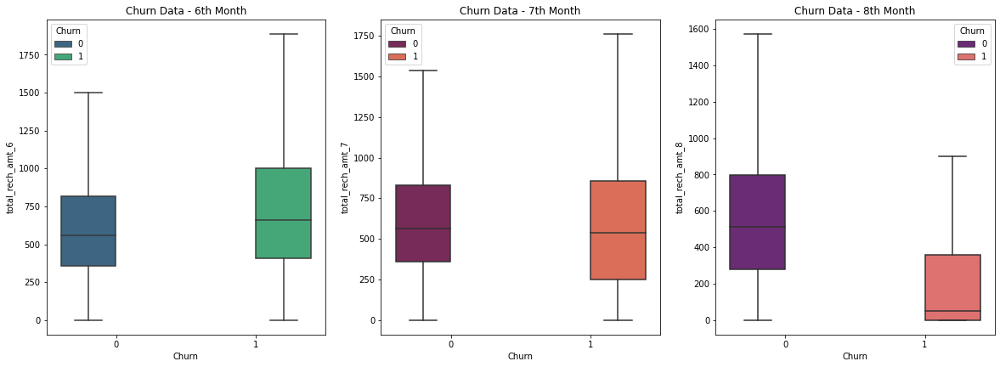

In [71]:
# plotting box plot to check churn data for total recharge amount

telecom_box_chart_plotting('total_rech_amt')

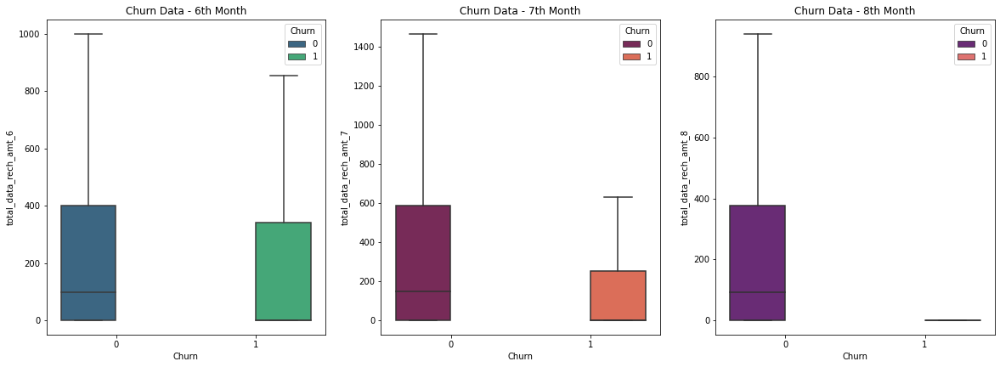

In [72]:
# plotting box plot to check churn data for total data recharge amount

telecom_box_chart_plotting('total_data_rech_amt')

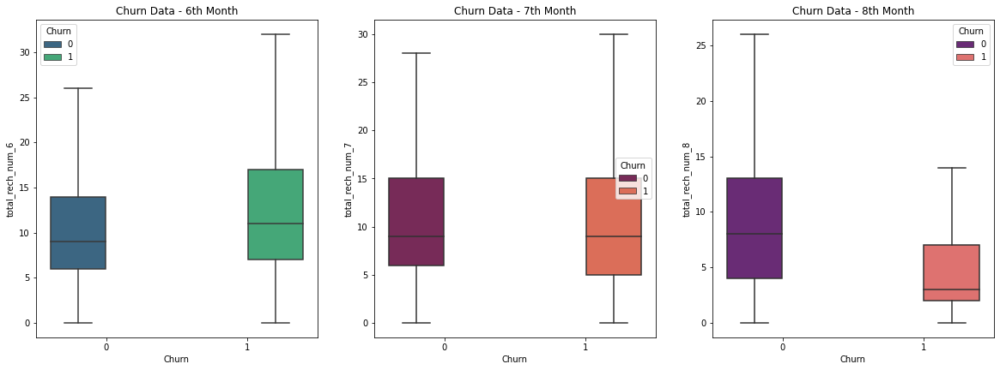

In [73]:
# plotting box plot to check churn data for total recharge number

telecom_box_chart_plotting('total_rech_num')

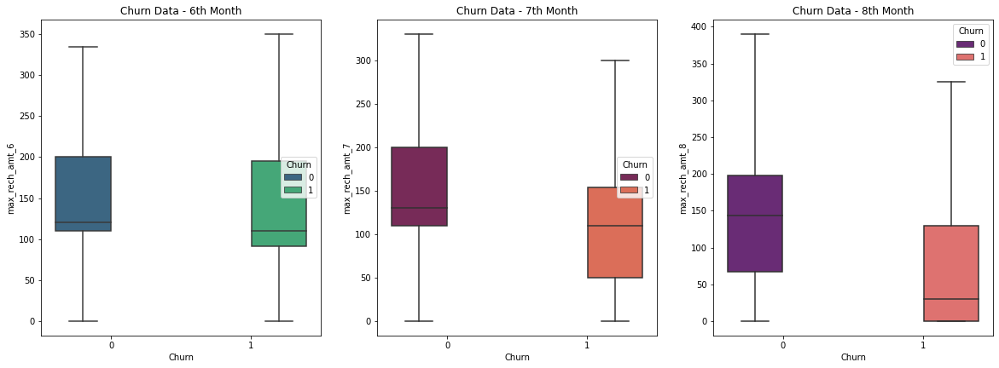

In [74]:
# plotting box plot to check churn data for maximum recharge amount

telecom_box_chart_plotting('max_rech_amt')

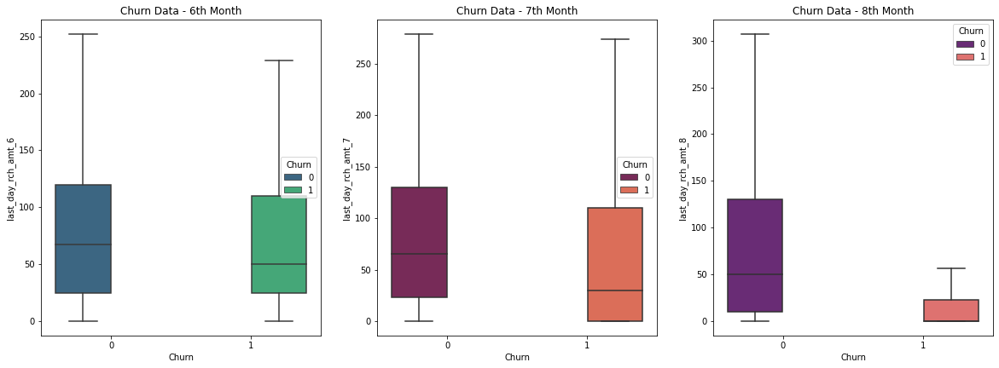

In [75]:
# plotting box plot to check churn data for last data recharge amount

telecom_box_chart_plotting('last_day_rch_amt')


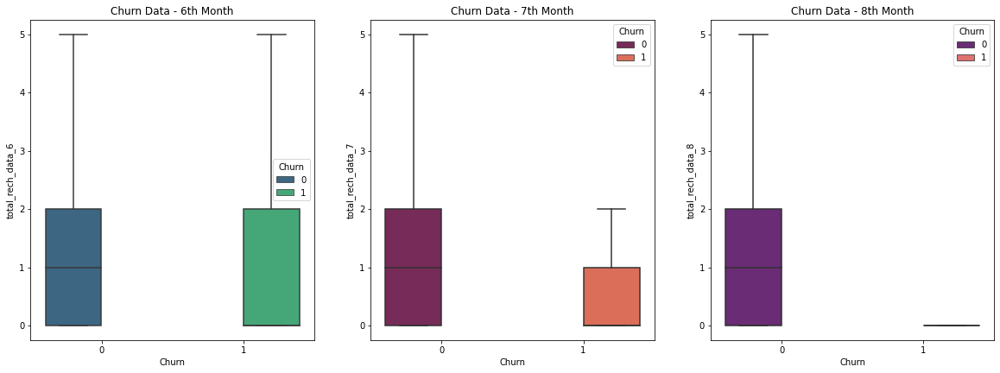

In [76]:
# plotting box plot to check churn data for total recharge data

telecom_box_chart_plotting('total_rech_data')

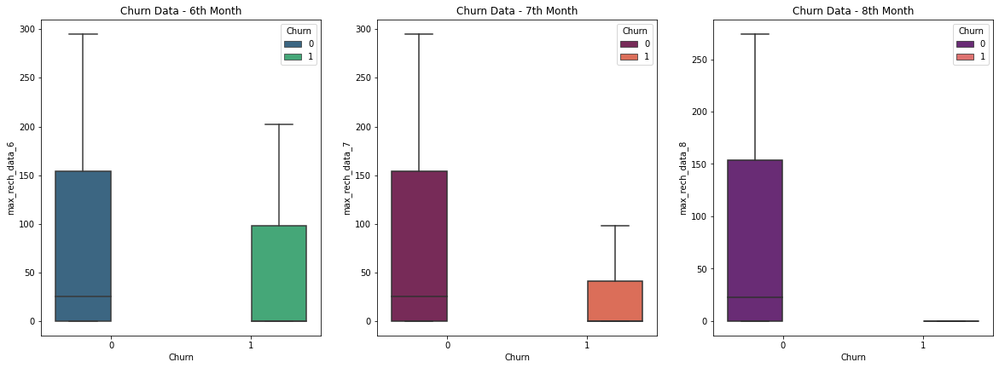

In [77]:
# plotting box plot to check churn data for maximum recharge data

telecom_box_chart_plotting('max_rech_data')

In [78]:
# filtering columns with monthly 2g and 2g data

month_sub = telecom_churn_data.columns[telecom_churn_data.columns.str.contains('monthly_2g|monthly_3g',regex=True)]

month_sub.tolist()

['monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8']

In [79]:
# creating function for plotting bar chart

def telecom_bar_chart(col):
    df_not_churn = telecom_churn_data[telecom_churn_data.Churn==0].filter(col)
    df_churn = telecom_churn_data[telecom_churn_data.Churn==1].filter(col)
    
    mean_df_not_churn = pd.DataFrame([df_not_churn.mean()],index={'Non Churn'})
    mean_df_churn = pd.DataFrame([df_churn.mean()],index={'Churn'})
    
    telecom_frames = [mean_df_not_churn,mean_df_churn]
    
    mean_bar = pd.concat(telecom_frames)
    
    mean_bar.T.plot.bar(figsize = (10,10) , rot=0)
    
    plt.show()
    
    return mean_bar

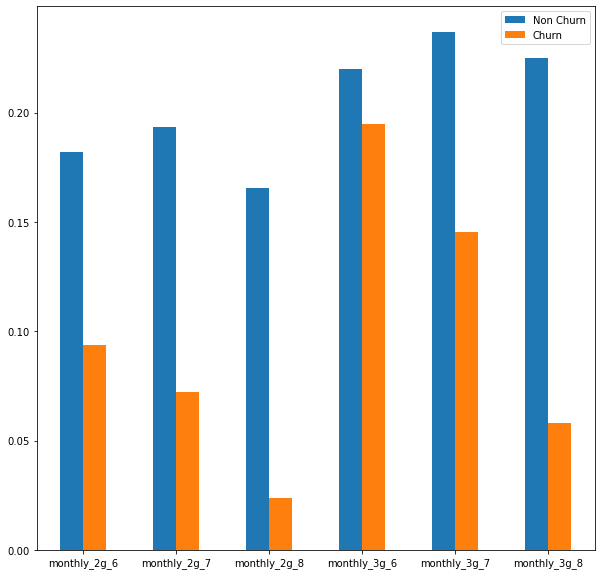

,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8
Non Churn,0.181865,0.193518,0.165513,0.219774,0.236744,0.225127
Churn,0.093486,0.072335,0.023689,0.194585,0.145516,0.057953


In [80]:
# plotting bar graph for monthly subscribers

telecom_bar_chart(month_sub)

In [81]:
# filtering columns with VBC (Volume Based Cost) 3G data

month_vbc = telecom_churn_data.columns[telecom_churn_data.columns.str.contains('vbc_3g',regex=True)]

month_vbc.tolist()

['vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6']

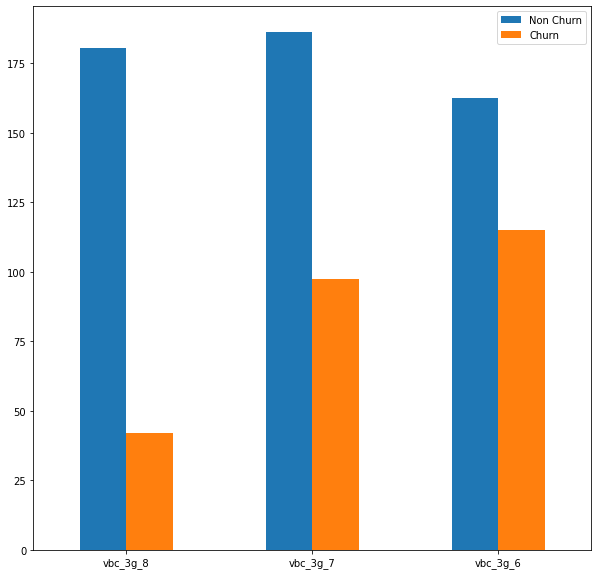

,vbc_3g_8,vbc_3g_7,vbc_3g_6
Non Churn,180.496883,186.209092,162.603763
Churn,41.909251,97.388075,115.036705


In [82]:
# plotting bar graph for VBC

telecom_bar_chart(month_vbc)

In [83]:
# filtering columns with monthly volume data for 2G and 3G

month_vol = telecom_churn_data.columns[telecom_churn_data.columns.str.contains('vol_2g|vol_3g',regex=True)]

month_vol.tolist()

['vol_2g_mb_6',
 'vol_2g_mb_7',
 'vol_2g_mb_8',
 'vol_3g_mb_6',
 'vol_3g_mb_7',
 'vol_3g_mb_8']

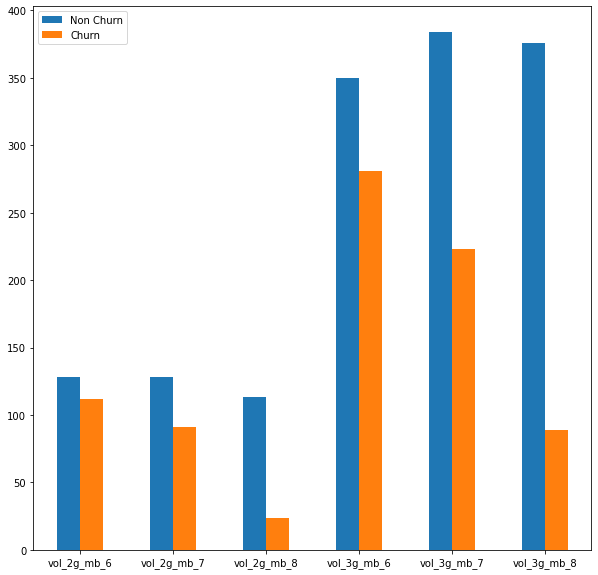

,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8
Non Churn,127.991449,128.466456,113.461514,350.163487,383.806354,375.419151
Churn,111.734437,91.048524,23.879695,280.943646,223.375008,89.208401


In [84]:
# plotting bar graph for monthly volume
telecom_bar_chart(month_vol)

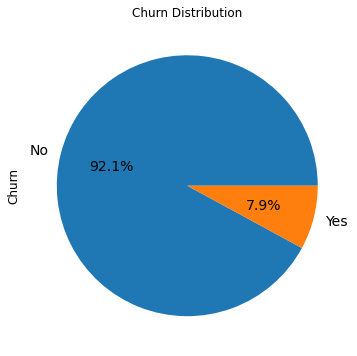

In [85]:
# plotting pie chart for churn percentage

telecom_pie_chart = telecom_churn_data['Churn'].value_counts()*100.0 /len(telecom_churn_data)
ax = telecom_pie_chart.plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(8,6), fontsize = 14 )                                                                           
ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)
plt.show()

In [86]:
# checking correlation for columns

pd.set_option('display.max_rows',None)
telecom_churn_data.corr()

,mobile_number,circle_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,...,vbc_3g_7,vbc_3g_6,total_data_rech_amt_6,total_data_rech_amt_7,total_data_rech_amt_8,total_rech_6,total_rech_7,total_rech_8,total_rech_6_7,Churn
mobile_number,1.000000,NaN,0.033453,0.031174,0.036597,0.010292,0.006141,0.008951,0.022585,0.014005,...,-0.027594,-0.037468,-0.018177,-0.018048,-0.007254,-0.004565,-0.004591,0.004615,-0.005384,-0.033718
circle_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
arpu_6,0.033453,NaN,1.000000,0.682003,0.619778,0.343885,0.218888,0.190011,0.515151,0.344861,...,0.055983,0.112693,0.089954,-0.023367,0.003365,0.422160,0.212240,0.209272,0.370454,0.067199
arpu_7,0.031174,NaN,0.682003,1.000000,0.767143,0.212713,0.321003,0.270779,0.355968,0.492669,...,0.101979,0.055333,-0.012701,0.091467,0.031556,0.232202,0.422034,0.283804,0.387016,-0.009176
arpu_8,0.036597,NaN,0.619778,0.767143,1.000000,0.150736,0.232295,0.345283,0.279095,0.376009,...,0.085783,0.074671,-0.002828,0.028811,0.130190,0.217316,0.295736,0.442132,0.302635,-0.156370
onnet_mou_6,0.010292,NaN,0.343885,0.212713,0.150736,1.000000,0.751896,0.621407,0.088235,0.036756,...,-0.111882,-0.101619,-0.098761,-0.103078,-0.076547,0.029717,-0.021822,-0.019220,0.004011,0.072536
onnet_mou_7,0.006141,NaN,0.218888,0.321003,0.232295,0.751896,1.000000,0.806452,0.052263,0.081527,...,-0.108569,-0.107797,-0.104092,-0.099973,-0.073818,-0.016746,0.019789,0.009376,0.002237,0.018319
onnet_mou_8,0.008951,NaN,0.190011,0.270779,0.345283,0.621407,0.806452,1.000000,0.060193,0.087117,...,-0.089146,-0.084429,-0.089457,-0.076219,-0.055305,-0.013616,0.026005,0.063295,0.007770,-0.075679
offnet_mou_6,0.022585,NaN,0.515151,0.355968,0.279095,0.088235,0.052263,0.060193,1.000000,0.739954,...,-0.103010,-0.085805,-0.110227,-0.131420,-0.089550,0.078207,0.001652,0.010958,0.046019,0.060370
offnet_mou_7,0.014005,NaN,0.344861,0.492669,0.376009,0.036756,0.081527,0.087117,0.739954,1.000000,...,-0.103323,-0.099998,-0.119530,-0.122544,-0.088084,0.012748,0.059418,0.043063,0.043005,0.005562


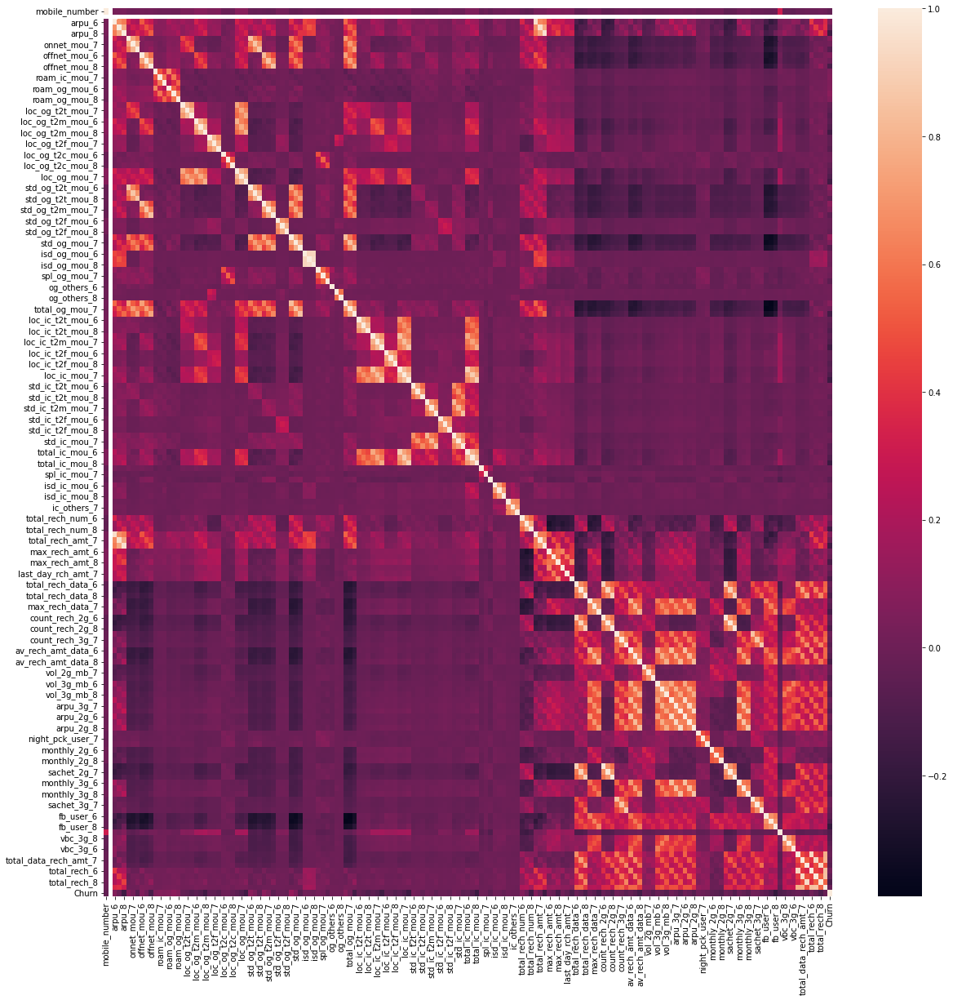

In [87]:
# checking heatmap

plt.figure(figsize=(20,20))

sns.heatmap(telecom_churn_data.corr())

plt.show()

In [88]:
# filtering higher correlated columns having correlation more than 80%

telecom_corr = telecom_churn_data.corr().abs()

telecom_corr_acc = telecom_corr.where(np.triu(np.ones(telecom_corr.shape),k=1).astype(np.bool))

telecom_higher_corr = [col for col in telecom_corr_acc.columns if any(telecom_corr_acc[col]>0.80)]

telecom_higher_corr

['onnet_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_7',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'std_ic_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'av_rech_amt_data_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'total_rech_6',
 'total_rech_7',
 'total_rech_8',
 't

In [89]:
# checking column counts for highly correlated columns

len(telecom_higher_corr)

56

#### Step 5: Model Building

In [90]:
# Dividing data into train and test

X = telecom_churn_data.drop('Churn',axis = 1)

y = telecom_churn_data[['Churn']]

In [91]:
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size = 0.7,test_size=0.3,random_state = 100)

In [92]:
X_train.shape

(20876, 160)

In [93]:
X_test.shape

(8948, 160)

In [94]:
y_train.shape

(20876, 1)

In [95]:
y_test.shape

(8948, 1)

**PCA**

In [96]:
# Applying PCA(Pipeline) to train data

pca = Pipeline([('scaler',StandardScaler()),('pca',PCA())])

In [97]:
pca.fit(X_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA())])

In [98]:
telecom_churn_pca = pca.fit_transform(X_train)

In [99]:
#Extracting PCA Models from pipeline

pca = pca.named_steps['pca']

In [100]:


pd.set_option('display.max_rows',None)
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       11.70
1       20.81
2       27.37
3       32.87
4       36.52
5       39.83
6       42.57
7       45.12
8       47.48
9       49.70
10      51.83
11      53.81
12      55.64
13      57.40
14      59.10
15      60.77
16      62.39
17      63.90
18      65.31
19      66.64
20      67.92
21      69.15
22      70.31
23      71.36
24      72.39
25      73.33
26      74.23
27      75.12
28      75.96
29      76.76
30      77.53
31      78.27
32      79.00
33      79.70
34      80.37
35      81.02
36      81.66
37      82.26
38      82.86
39      83.45
40      84.01
41      84.55
42      85.07
43      85.58
44      86.07
45      86.55
46      86.99
47      87.42
48      87.85
49      88.26
50      88.67
51      89.07
52      89.45
53      89.83
54      90.20
55      90.53
56      90.87
57      91.18
58      91.49
59      91.79
60      92.08
61      92.36
62      92.63
63      92.89
64      93.16
65      93.41
66      93.67
67      93.90
68      94.14
69      94.37
70      94.58
71    

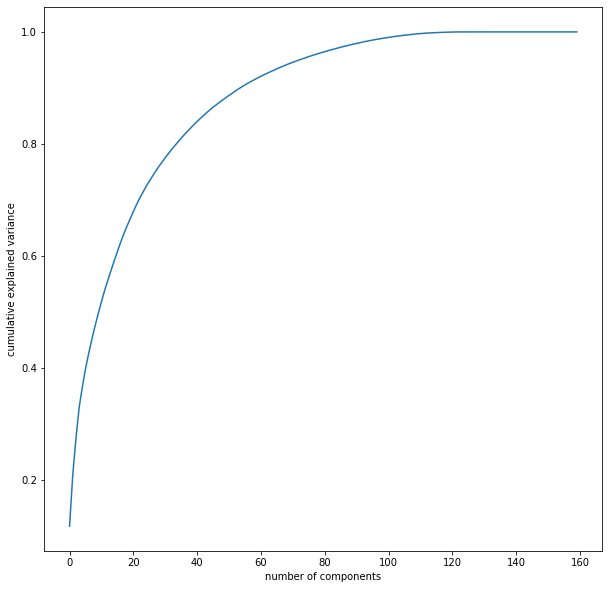

In [101]:
fig = plt.figure(figsize = (10,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_))

plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

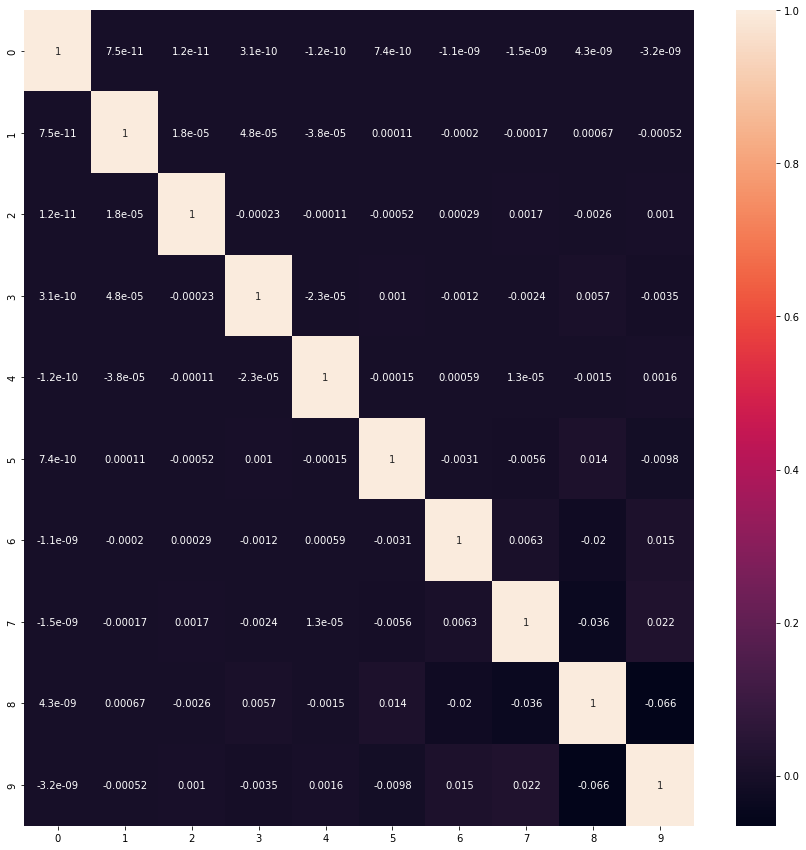

In [102]:
telecom_pca_final = IncrementalPCA(n_components = 10)

X_train_pca = telecom_pca_final.fit_transform(X_train)
X_test_pca = telecom_pca_final.fit_transform(X_test)

telecom_corr = np.corrcoef(X_train_pca.transpose())

plt.figure(figsize=(15,15))
sns.heatmap(telecom_corr,annot=True)
plt.show()


**PCA and Logistic Regression**

In [103]:
#creating pipeline

telecom_pca_vars = 80
steps = [('scaler',StandardScaler()),
        ('pca',PCA(n_components = telecom_pca_vars)),
        ('logistics',LogisticRegression(class_weight='balanced'))]


In [104]:
pipeline = Pipeline(steps)

In [105]:
# fitting the pipeline model
pipeline.fit(X_train,y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=80)),
                ('logistics', LogisticRegression(class_weight='balanced'))])

In [106]:
# chekcing score of Train Data

pipeline.score(X_train,y_train)

0.811362329948266

**Evaluating Test Data for Pipeline**

In [107]:
#predicting churn on test data
y_pred = pipeline.predict(X_test)

#checking confusion metrix for pipeline
pipeline_cm = confusion_matrix(y_test,y_pred)

print(pipeline_cm)

[[6698 1566]
 [ 112  572]]


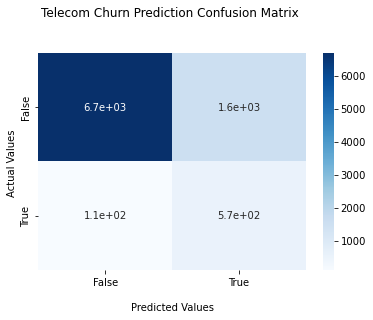

In [108]:
#plotting heatmap for pipeline confusion matrix

telecom_cm_heatmap = sns.heatmap(pipeline_cm,annot=True,cmap='Blues')

telecom_cm_heatmap.set_title('Telecom Churn Prediction Confusion Matrix \n\n');
telecom_cm_heatmap.set_xlabel('\nPredicted Values')
telecom_cm_heatmap.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
telecom_cm_heatmap.xaxis.set_ticklabels(['False','True'])
telecom_cm_heatmap.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [109]:
#checking sensitivity and specificity of pipeline

sensitivity , specificity , _ = sensitivity_specificity_support(y_test,y_pred,average='binary')

# checking accuracy of pipeline
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)

In [110]:
#checking area under curve for pipeline

y_pred_prob = pipeline.predict_proba(X_test)[:,1]
AUC = round(roc_auc_score(y_test,y_pred_prob),2)

In [111]:
print("Sensitivity : ",sensitivity)
print("Specificity : ",specificity)
print("Accuracy Score : ",accuracy_score(y_test,y_pred))
print("Precision : ",precision_score(y_test, y_pred))
print("Recall : ",recall_score(y_test, y_pred))
print("AUC : ",AUC)

Sensitivity :  0.8362573099415205
Specificity :  0.8105033881897387
Accuracy Score :  0.8124720607957086
Precision :  0.2675397567820393
Recall :  0.8362573099415205
AUC :  0.9


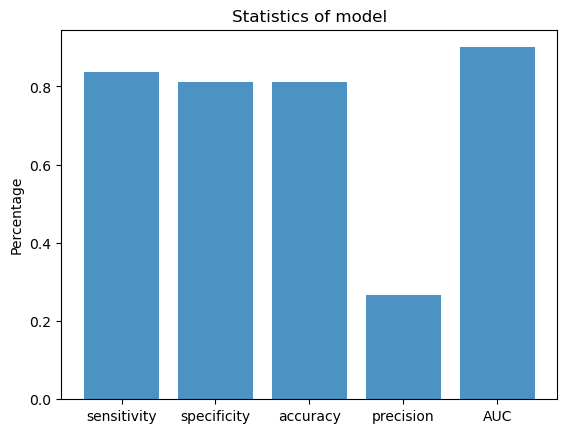

In [112]:
# plotting bar chart for pipeline

plt.rcdefaults()
objects = ('sensitivity', 'specificity', 'accuracy', 'precision', 'AUC')
y_pos = np.arange(len(objects))
values = [sensitivity,specificity,accuracy,precision,AUC]

plt.bar(y_pos, values, align='center', alpha=0.8)
plt.xticks(y_pos, objects)
plt.ylabel('Percentage')
plt.title('Statistics of model')

plt.show()

**Hyper Parameter Tuning**

In [113]:
telecom_churn_percent = round((y_train.value_counts()/len(y_train)),1)

In [114]:
# checking class imbalance

telecom_imbalance = y_train.value_counts()/y_train.shape

In [115]:
telecom_imbalance

Churn
0           0.919525
1        1680.000000
dtype: float64

In [116]:
telecom_churn_percent

Churn
0        0.9
1        0.1
dtype: float64

In [117]:
# declaring PCA

pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function

telecom_logistic = LogisticRegression(class_weight={0:0.1,1:0.9})

# creatinfg pipeline step

hyper_steps = [('scaler',StandardScaler()),
               ('pca',pca),
              ('logistic',telecom_logistic)
              ]

#compiling pipeline 
telecom_pca_logistic = Pipeline(hyper_steps)

#creating hyperparameter space 
params = {'pca__n_components':[60,80],'logistic__C':[0.1,0.5,1,2,3,4,5,10],'logistic__penalty':['l1','l2']}

#creating 5 folds
folds = StratifiedKFold(n_splits = 5,shuffle = True,random_state = 4)

#folds = StratifiedKFold(n_splits = 5,shuffle = False)

#creating gridsearch objects

hyper_model = GridSearchCV(estimator = telecom_pca_logistic,cv = folds,param_grid = params,scoring = 'roc_auc',n_jobs = -1,verbose=1)


In [118]:
# fitting model for hyper parameter

hyper_model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 80]},
             scoring='roc_auc', verbose=1)

In [119]:
#cross validation result dfor hyperparameter

pd.DataFrame(hyper_model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,2.504530,0.254315,0.000000,0.000000,0.1,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,32
1,2.737995,0.341637,0.000000,0.000000,0.1,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,28
2,2.585952,0.217564,0.065361,0.014758,0.1,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.881135,0.884245,0.894661,0.869109,0.887518,0.883333,0.008412,11
3,2.954094,0.329983,0.071975,0.007571,0.1,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.883874,0.888197,0.895530,0.872936,0.885118,0.885131,0.007319,1
4,1.960827,0.072157,0.000000,0.000000,0.5,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,23
5,2.352460,0.096075,0.000000,0.000000,0.5,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,22
6,2.633863,0.123901,0.056266,0.012502,0.5,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.881441,0.885420,0.894929,0.868978,0.886360,0.883426,0.008457,10
7,3.094151,0.208583,0.074604,0.011039,0.5,l2,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.883822,0.887531,0.895923,0.872931,0.885428,0.885127,0.007388,2
8,1.938545,0.055089,0.000000,0.000000,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,30
9,2.568722,0.250939,0.000000,0.000000,1,l1,80,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,29


In [120]:
# checking best score and best hyperparameter

print("Best Score: ", hyper_model.best_score_)
print("Best hyperparameters: ", hyper_model.best_params_)

Best Score:  0.8851311443687541
Best hyperparameters:  {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 80}


In [121]:
y_pred = hyper_model.predict(X_test)

hyper_cm = confusion_matrix(y_test,y_pred)


In [122]:
hyper_cm

array([[7021, 1243],
       [ 133,  551]], dtype=int64)

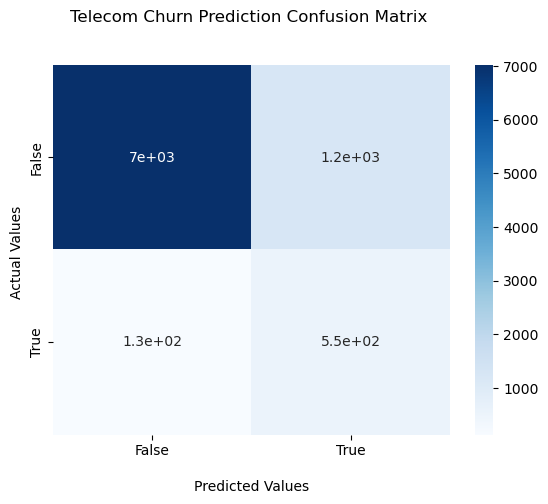

In [123]:
telecom_cm_heatmap = sns.heatmap(hyper_cm,annot=True,cmap='Blues')

telecom_cm_heatmap.set_title('Telecom Churn Prediction Confusion Matrix \n\n');
telecom_cm_heatmap.set_xlabel('\nPredicted Values')
telecom_cm_heatmap.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
telecom_cm_heatmap.xaxis.set_ticklabels(['False','True'])
telecom_cm_heatmap.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [124]:
# checking sensitivity and specificity for hyperparameter
sensitivity,specificity,_ = sensitivity_specificity_support(y_test,y_pred,average='binary')

# checking accuracy 
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)


In [125]:
y_pred_prob = hyper_model.predict_proba(X_test)[:,1]

AUC = round(roc_auc_score(y_test,y_pred_prob),2)

In [126]:
print("Sensitivity : ",sensitivity)
print("Specificity : ",specificity)
print("Accuracy Score : ",accuracy_score(y_test,y_pred))
print("Precision : ",precision_score(y_test, y_pred))
print("Recall : ",recall_score(y_test, y_pred))
print("AUC : ",AUC)

Sensitivity :  0.8055555555555556
Specificity :  0.8495885769603098
Accuracy Score :  0.8462226195797944
Precision :  0.3071348940914158
Recall :  0.8055555555555556
AUC :  0.9


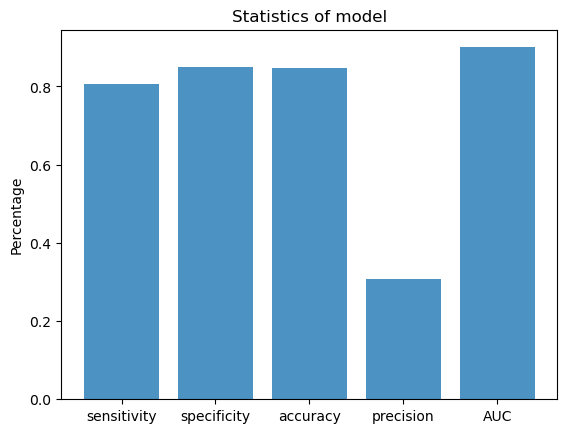

In [127]:
# plotting bar chart for hyper parameter

plt.rcdefaults()
objects = ('sensitivity', 'specificity', 'accuracy', 'precision', 'AUC')
y_pos = np.arange(len(objects))
values = [sensitivity,specificity,accuracy,precision,AUC]

plt.bar(y_pos, values, align='center', alpha=0.8)
plt.xticks(y_pos, objects)
plt.ylabel('Percentage')
plt.title('Statistics of model')

plt.show()

**Random Forest**

In [128]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function

telecom_forest =  RandomForestClassifier(class_weight={0:0.1,1:0.9} , n_jobs = -1)

# hyperparameter space
params = {'criterion':['gini','entropy'],'max_features':['auto',0.4]}

# creatinf 5 folds
folds = StratifiedKFold(n_splits=5,shuffle=True,random_state=4)

# create gridsearch object for random forest
rf_model = GridSearchCV(estimator=telecom_forest,cv = folds,param_grid = params,scoring = 'roc_auc',n_jobs = -1 ,verbose = 1)

In [129]:
# fitting model for random forest

rf_model.fit(X_train,y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [130]:
# checking best score for random forest

best_score = rf_model.best_score_
best_score

0.9237621969065462

In [131]:
# checking besgt parameter for random forest
rf_model.best_params_

{'criterion': 'entropy', 'max_features': 0.4}

In [132]:
# predict churn on test data# create onfusion matrix

y_pred = rf_model.predict(X_test)

# create confusion matrix for random forest

rf_cm = confusion_matrix(y_test,y_pred)

rf_cm

array([[8146,  118],
       [ 338,  346]], dtype=int64)

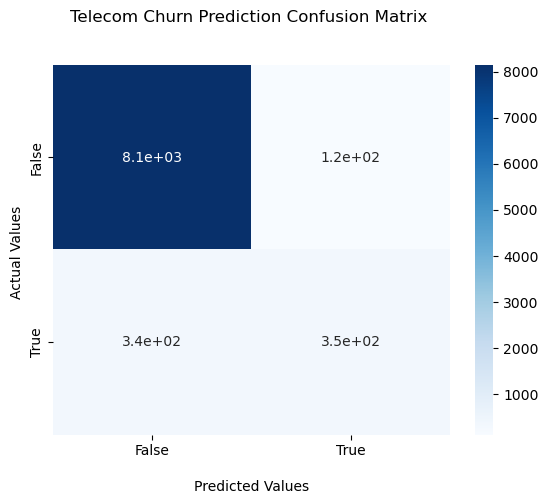

In [133]:
telecom_cm_heatmap = sns.heatmap(rf_cm,annot=True,cmap='Blues')

telecom_cm_heatmap.set_title('Telecom Churn Prediction Confusion Matrix \n\n');
telecom_cm_heatmap.set_xlabel('\nPredicted Values')
telecom_cm_heatmap.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
telecom_cm_heatmap.xaxis.set_ticklabels(['False','True'])
telecom_cm_heatmap.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [134]:
# checking sensitivity and sepcificity

sensitivity , specificity , _ = sensitivity_specificity_support(y_test,y_pred,average = 'binary')


# checking accuracy 
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)

In [135]:
y_pred_prob = rf_model.predict_proba(X_test)[:,1]

AUC = round(roc_auc_score(y_test,y_pred_prob),2)

In [136]:
print("Sensitivity : ",sensitivity)
print("Specificity : ",specificity)
print("Accuracy Score : ",accuracy_score(y_test,y_pred))
print("Precision : ",precision_score(y_test, y_pred))
print("Recall : ",recall_score(y_test, y_pred))
print("AUC : ",round(roc_auc_score(y_test,y_pred_prob),2))

Sensitivity :  0.5058479532163743
Specificity :  0.9857212003872217
Accuracy Score :  0.9490388913723737
Precision :  0.7456896551724138
Recall :  0.5058479532163743
AUC :  0.94


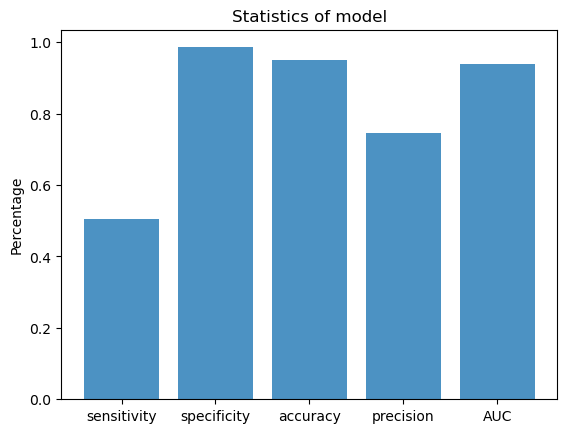

In [137]:
# plotting bar chart for random forest

plt.rcdefaults()
objects = ('sensitivity', 'specificity', 'accuracy', 'precision', 'AUC')
y_pos = np.arange(len(objects))
values = [sensitivity,specificity,accuracy,precision,AUC]

plt.bar(y_pos, values, align='center', alpha=0.8)
plt.xticks(y_pos, objects)
plt.ylabel('Percentage')
plt.title('Statistics of model')

plt.show()

In [138]:
# run a random forest model on train data for max features
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf1_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

13


In [139]:
# fitting model

rf1_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.4s finished


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=13,
                       oob_score=True, random_state=4, verbose=1)

In [140]:
# chekcing OOB(Out Of Box) score

rf1_model.oob_score_

0.941463881969726

In [141]:
# predict churn for test data

y_pred = rf1_model.predict(X_test)

# create confusion matrix
rf1_cm = confusion_matrix(y_test, y_pred)
print(rf1_cm)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[[8159  105]
 [ 367  317]]


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


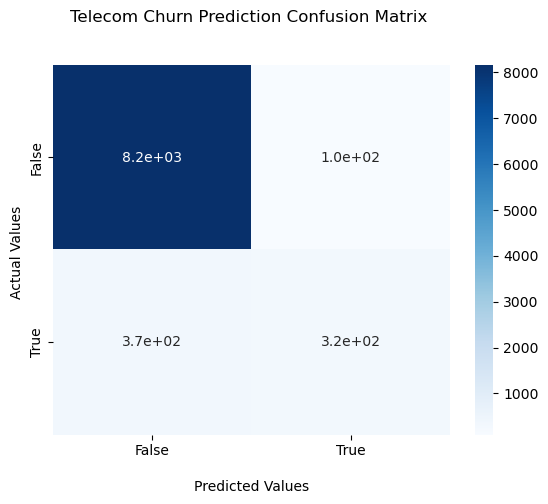

In [142]:
telecom_cm_heatmap = sns.heatmap(rf1_cm,annot=True,cmap='Blues')

telecom_cm_heatmap.set_title('Telecom Churn Prediction Confusion Matrix \n\n');
telecom_cm_heatmap.set_xlabel('\nPredicted Values')
telecom_cm_heatmap.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
telecom_cm_heatmap.xaxis.set_ticklabels(['False','True'])
telecom_cm_heatmap.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [143]:
#chekcing sensitivity and specificity

sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')

# checking accuracy 
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)

In [144]:
# chekcing AUC

y_pred_prob = rf1_model.predict_proba(X_test)[:, 1]
AUC = round(roc_auc_score(y_test,y_pred_prob),2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


In [145]:
print("Sensitivity : ",sensitivity)
print("Specificity : ",specificity)
print("Accuracy Score : ",accuracy_score(y_test,y_pred))
print("Precision : ",precision_score(y_test, y_pred))
print("Recall : ",recall_score(y_test, y_pred))
print("AUC : ",AUC)

Sensitivity :  0.46345029239766083
Specificity :  0.9872942884801549
Accuracy Score :  0.9472507822977202
Precision :  0.7511848341232228
Recall :  0.46345029239766083
AUC :  0.93


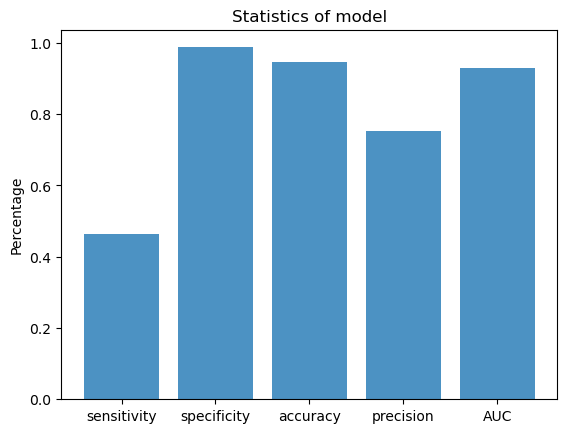

In [146]:
# plotting bar chart for max features

plt.rcdefaults()
objects = ('sensitivity', 'specificity', 'accuracy', 'precision', 'AUC')
y_pos = np.arange(len(objects))
values = [sensitivity,specificity,accuracy,precision,AUC]

plt.bar(y_pos, values, align='center', alpha=0.8)
plt.xticks(y_pos, objects)
plt.ylabel('Percentage')
plt.title('Statistics of model')

plt.show()

**Feature Importance**

In [147]:
# predictor

telecom_feature = telecom_churn_data.drop('Churn',axis=1).columns
telecom_feature

Index(['mobile_number', 'circle_id', 'arpu_6', 'arpu_7', 'arpu_8',
       'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7',
       ...
       'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6', 'total_data_rech_amt_6',
       'total_data_rech_amt_7', 'total_data_rech_amt_8', 'total_rech_6',
       'total_rech_7', 'total_rech_8', 'total_rech_6_7'],
      dtype='object', length=160)

In [148]:
# creating feature importance

telecom_importance = rf1_model.feature_importances_
telecom_importance

array([6.40054626e-03, 0.00000000e+00, 5.96515564e-03, 8.13195741e-03,
       1.06944083e-02, 4.73648437e-03, 5.55348523e-03, 8.10301809e-03,
       5.35918686e-03, 5.50370884e-03, 9.90641741e-03, 2.35855699e-03,
       3.20073669e-03, 2.24672960e-02, 2.08709620e-03, 4.24939913e-03,
       2.91987002e-02, 3.90905977e-03, 4.42847319e-03, 1.83693738e-02,
       4.64884423e-03, 5.34184129e-03, 2.28753598e-02, 2.95062653e-03,
       2.85321592e-03, 6.12939159e-03, 1.78038898e-03, 1.86575890e-03,
       2.15411003e-03, 5.00953824e-03, 5.72443946e-03, 2.92351702e-02,
       4.33679572e-03, 4.86703390e-03, 4.54029800e-03, 4.87599407e-03,
       5.26169191e-03, 5.37825715e-03, 1.16585384e-03, 1.27768104e-03,
       6.52704457e-04, 4.83035211e-03, 6.57626026e-03, 7.64601337e-03,
       1.61745728e-03, 1.52360850e-03, 1.01598514e-03, 3.14414138e-03,
       3.40100518e-03, 5.47155654e-03, 2.25793831e-03, 7.10560834e-05,
       7.56226363e-05, 4.80784732e-03, 5.99580841e-03, 2.41803489e-02,
      

In [149]:
# creationg dataframe for telecom features

telecom_feature_importance = pd.DataFrame({'Telecom Variable' : telecom_feature,'Importance Percentage':telecom_importance * 100}) 
telecom_feature_importance  = telecom_feature_importance[['Telecom Variable','Importance Percentage']]

In [150]:
pd.set_option('display.max_rows',None)
telecom_feature_importance

,Telecom Variable,Importance Percentage
0,mobile_number,0.640055
1,circle_id,0.000000
2,arpu_6,0.596516
3,arpu_7,0.813196
4,arpu_8,1.069441
5,onnet_mou_6,0.473648
6,onnet_mou_7,0.555349
7,onnet_mou_8,0.810302
8,offnet_mou_6,0.535919
9,offnet_mou_7,0.550371


In [151]:
telecom_feature_importance=telecom_feature_importance.sort_values('Importance Percentage',ascending=False).reset_index(drop=True)

In [152]:
telecom_feature_importance

,Telecom Variable,Importance Percentage
0,loc_ic_t2t_mou_8,4.923859
1,loc_ic_t2m_mou_8,4.852915
2,loc_ic_mou_8,4.827368
3,total_rech_8,4.458118
4,total_ic_mou_8,3.532973
5,loc_og_mou_8,2.923517
6,roam_og_mou_8,2.919870
7,last_day_rch_amt_8,2.621840
8,std_ic_mou_8,2.504820
9,total_og_mou_8,2.418035


In [153]:
# sorting the feature importance

telecom_feature_importance_top=telecom_feature_importance.sort_values('Importance Percentage',ascending=False).set_index('Telecom Variable')

In [154]:
telecom_feature_importance_top

,Importance Percentage
Telecom Variable,
loc_ic_t2t_mou_8,4.923859
loc_ic_t2m_mou_8,4.852915
loc_ic_mou_8,4.827368
total_rech_8,4.458118
total_ic_mou_8,3.532973
loc_og_mou_8,2.923517
roam_og_mou_8,2.919870
last_day_rch_amt_8,2.621840
std_ic_mou_8,2.504820


In [155]:
# chekcing sum of importance

print("Sum of Importance : ",telecom_feature_importance['Importance Percentage'].sum())

Sum of Importance :  100.0


**Extracting Top 20 Features**

In [156]:
# extracting top 20 columns

n = 20
telecom_top_features = telecom_feature_importance['Telecom Variable'][0:n]

In [157]:
# top 20 columns

telecom_top_features

0          loc_ic_t2t_mou_8
1          loc_ic_t2m_mou_8
2              loc_ic_mou_8
3              total_rech_8
4            total_ic_mou_8
5              loc_og_mou_8
6             roam_og_mou_8
7        last_day_rch_amt_8
8              std_ic_mou_8
9            total_og_mou_8
10         loc_og_t2m_mou_8
11            roam_ic_mou_8
12         loc_og_t2t_mou_8
13         total_rech_amt_8
14         loc_ic_t2f_mou_8
15       av_rech_amt_data_8
16    total_data_rech_amt_8
17           max_rech_amt_8
18                   arpu_8
19              vol_2g_mb_8
Name: Telecom Variable, dtype: object

In [158]:
# correlations for top 20 features

X_train[telecom_top_features].corr()

,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_mou_8,total_rech_8,total_ic_mou_8,loc_og_mou_8,roam_og_mou_8,last_day_rch_amt_8,std_ic_mou_8,total_og_mou_8,loc_og_t2m_mou_8,roam_ic_mou_8,loc_og_t2t_mou_8,total_rech_amt_8,loc_ic_t2f_mou_8,av_rech_amt_data_8,total_data_rech_amt_8,max_rech_amt_8,arpu_8,vol_2g_mb_8
loc_ic_t2t_mou_8,1.000000,0.227309,0.687555,0.030540,0.602499,0.278841,-0.029763,0.053156,0.032038,0.111953,0.158203,-0.015220,0.272684,0.101228,0.130658,0.023552,-0.004242,0.067416,0.103107,-0.017729
loc_ic_t2m_mou_8,0.227309,1.000000,0.852044,0.045501,0.763579,0.412110,-0.064037,0.115965,0.079513,0.149866,0.507551,-0.047144,0.129766,0.179248,0.251889,0.023288,-0.017064,0.136287,0.188408,-0.027234
loc_ic_mou_8,0.687555,0.852044,1.000000,0.049432,0.888683,0.455571,-0.065201,0.120269,0.076270,0.167197,0.461230,-0.044149,0.240393,0.186106,0.377960,0.031666,-0.015277,0.145174,0.194752,-0.029237
total_rech_8,0.030540,0.045501,0.049432,1.000000,0.065682,0.074606,0.045586,0.134479,0.036238,0.126349,0.074542,0.020806,0.041115,0.455255,0.014094,0.596409,0.941691,0.200710,0.448904,0.164540
total_ic_mou_8,0.602499,0.763579,0.888683,0.065682,1.000000,0.405039,-0.052949,0.125986,0.476897,0.204863,0.414050,-0.023751,0.208410,0.229928,0.334892,0.037523,-0.013741,0.170914,0.241197,-0.026588
loc_og_mou_8,0.278841,0.412110,0.455571,0.074606,0.405039,1.000000,-0.033794,0.167501,0.030913,0.488418,0.774743,-0.038125,0.775835,0.308385,0.177670,-0.015710,-0.033451,0.201436,0.319901,-0.059205
roam_og_mou_8,-0.029763,-0.064037,-0.065201,0.045586,-0.052949,-0.033794,1.000000,0.097012,0.012861,-0.002142,-0.038176,0.536076,-0.013464,0.184106,-0.037530,-0.023593,-0.018805,0.123349,0.186957,-0.013203
last_day_rch_amt_8,0.053156,0.115965,0.120269,0.134479,0.125986,0.167501,0.097012,1.000000,0.041061,0.119327,0.183183,0.052901,0.067265,0.377197,0.087130,0.172382,0.007226,0.695916,0.327950,-0.026853
std_ic_mou_8,0.032038,0.079513,0.076270,0.036238,0.476897,0.030913,0.012861,0.041061,1.000000,0.149154,0.037858,0.025342,0.007616,0.120790,0.030395,0.009907,-0.005289,0.080246,0.127260,-0.000958
total_og_mou_8,0.111953,0.149866,0.167197,0.126349,0.204863,0.488418,-0.002142,0.119327,0.149154,1.000000,0.373026,-0.040800,0.387254,0.523348,0.035892,-0.143851,-0.057061,0.143853,0.535377,-0.090205


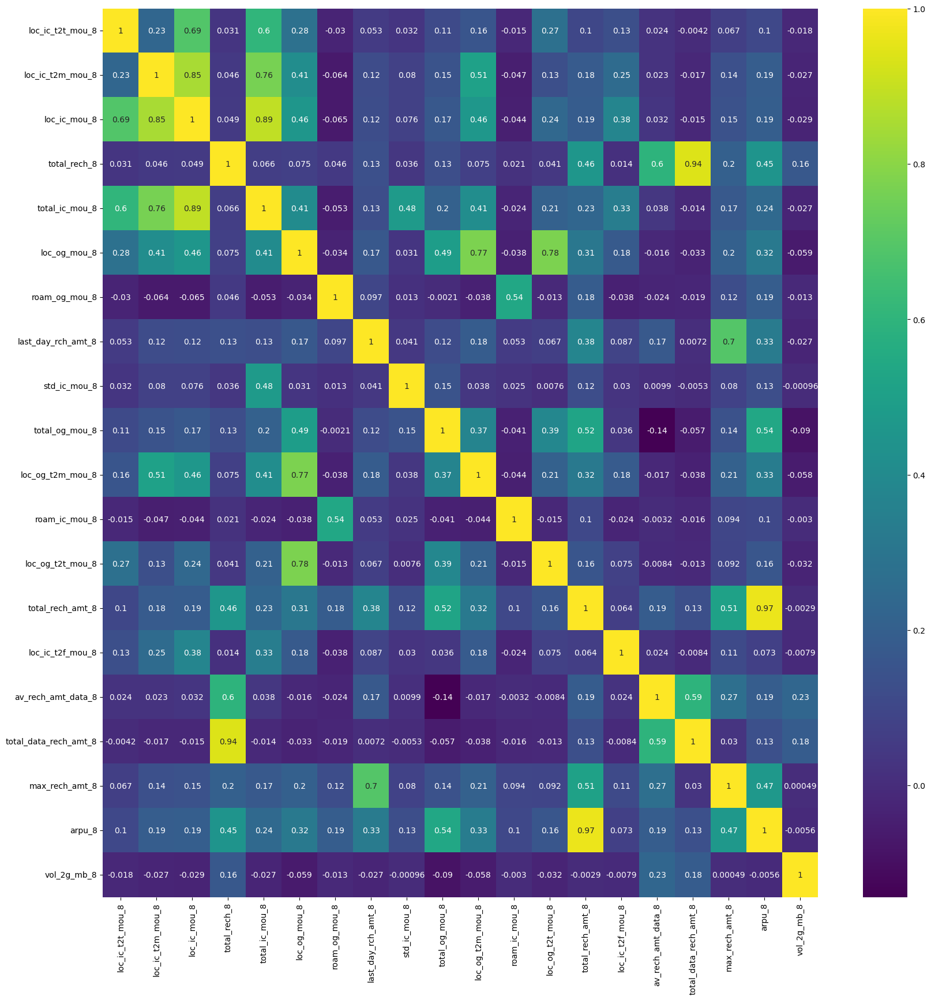

In [159]:
# histogram for correlations

plt.figure(figsize=(20,20))

sns.heatmap(X_train[telecom_top_features].corr(),annot = True,cmap = 'viridis')

plt.show()

In [160]:
X_train[telecom_top_features].columns

Index(['loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_8', 'total_rech_8',
       'total_ic_mou_8', 'loc_og_mou_8', 'roam_og_mou_8', 'last_day_rch_amt_8',
       'std_ic_mou_8', 'total_og_mou_8', 'loc_og_t2m_mou_8', 'roam_ic_mou_8',
       'loc_og_t2t_mou_8', 'total_rech_amt_8', 'loc_ic_t2f_mou_8',
       'av_rech_amt_data_8', 'total_data_rech_amt_8', 'max_rech_amt_8',
       'arpu_8', 'vol_2g_mb_8'],
      dtype='object')

In [161]:
 telecom_top_features_1= ['loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_8', 'total_rech_8',
       'total_ic_mou_8', 'loc_og_mou_8', 'roam_og_mou_8', 'last_day_rch_amt_8',
       'std_ic_mou_8', 'total_og_mou_8', 'loc_og_t2m_mou_8', 'roam_ic_mou_8',
       'loc_og_t2t_mou_8', 'total_rech_amt_8', 'loc_ic_t2f_mou_8',
       'av_rech_amt_data_8', 'total_data_rech_amt_8', 'max_rech_amt_8',
       'arpu_8', 'vol_2g_mb_8']

In [162]:
X_train = X_train[telecom_top_features_1]
X_test = X_test[telecom_top_features_1]

In [163]:
#creating logistic regression

steps =  [('scaler',StandardScaler()),
         ('logistic',LogisticRegression(class_weight={0:0.1,1:0.9}))
         ]

#compiling pipeline for top features

telecom_features_logistic = Pipeline(steps)

#hyperparameters space for top features

params = {'logistic__C':[0.1,0.5,1.2,3,4,5,10],'logistic__penalty':['l1','l2']}

# creating 5 folds

folds = StratifiedKFold(n_splits = 5 , shuffle= True,random_state = 4)

#creating gridsearch object for top features

telecom_feature_model = GridSearchCV(estimator = telecom_features_logistic,cv = folds,param_grid = params,scoring = 'roc_auc',n_jobs = -1,verbose = 1)

In [164]:
# fitting model for top features

telecom_feature_model.fit(X_train,y_train)

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1.2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2']},
             scoring='roc_auc', verbose=1)

In [165]:
# checking best score

best_score = telecom_feature_model.best_score_

In [166]:
best_score

0.8685555443749756

In [167]:
# chekcing best parameter 

telecom_feature_model.best_params_

{'logistic__C': 0.5, 'logistic__penalty': 'l2'}

In [168]:
#predicting churn for test data
y_pred = telecom_feature_model.predict(X_test)

#creating confusion metrix for top features
top_cm = confusion_matrix(y_test,y_pred)

top_cm

array([[6560, 1704],
       [ 121,  563]], dtype=int64)

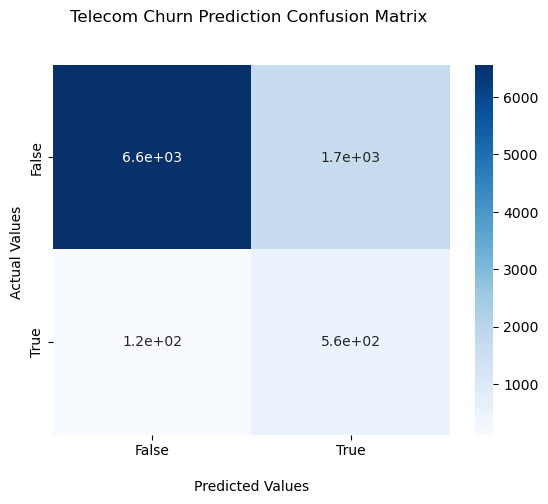

<Figure size 1000x1000 with 0 Axes>

In [169]:
telecom_cm_heatmap = sns.heatmap(top_cm,annot=True,cmap='Blues')

plt.figure(figsize=(10,10))
telecom_cm_heatmap.set_title('Telecom Churn Prediction Confusion Matrix \n\n');
telecom_cm_heatmap.set_xlabel('\nPredicted Values')
telecom_cm_heatmap.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
telecom_cm_heatmap.xaxis.set_ticklabels(['False','True'])
telecom_cm_heatmap.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [170]:
sensitivity,specificity,_ = sensitivity_specificity_support(y_test,y_pred,average='binary')

# checking accuracy 
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)

In [171]:
y_pred_prob = telecom_feature_model.predict_proba(X_test)[:, 1]

AUC = round(roc_auc_score(y_test,y_pred_prob),2)

In [172]:
# checking accuracy 
accuracy = accuracy_score(y_test,y_pred)

#checking precision
precision = precision_score(y_test, y_pred)

In [173]:
print("Sensitivity : ",sensitivity)
print("Specificity : ",specificity)
print("Accuracy Score : ",accuracy_score(y_test,y_pred))
print("Precision : ",precision_score(y_test, y_pred))
print("Recall : ",recall_score(y_test, y_pred))
print("AUC : ", AUC)

Sensitivity :  0.8230994152046783
Specificity :  0.7938044530493708
Accuracy Score :  0.796043808672329
Precision :  0.24834583149536832
Recall :  0.8230994152046783
AUC :  0.89


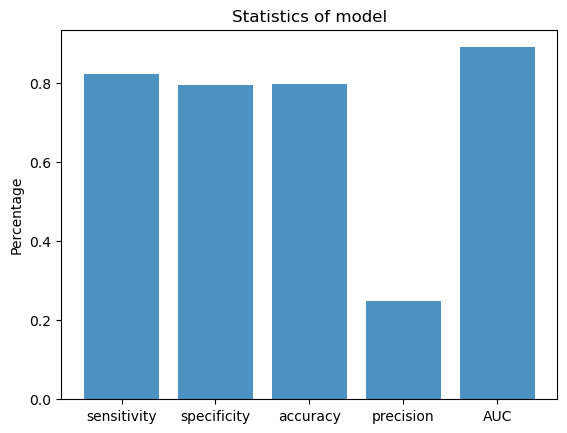

In [174]:
# plotting bar chart for top features

plt.rcdefaults()
objects = ('sensitivity', 'specificity', 'accuracy', 'precision', 'AUC')
y_pos = np.arange(len(objects))
values = [sensitivity,specificity,accuracy,precision,AUC]

plt.bar(y_pos, values, align='center', alpha=0.8)
plt.xticks(y_pos, objects)
plt.ylabel('Percentage')
plt.title('Statistics of model')

plt.show()


In [175]:
# chekcing logistic model for top features

telecom_logistic_model = telecom_feature_model.best_estimator_.named_steps['logistic']

In [176]:
telecom_logistic_model

LogisticRegression(C=0.5, class_weight={0: 0.1, 1: 0.9})

In [177]:
#intercept for top models

telecom_intercept = pd.DataFrame(telecom_logistic_model.intercept_,columns = ['intercept'])

In [178]:
telecom_intercept

,intercept
0,-1.580778


In [179]:
# chekcing coefficients
coefficients = telecom_logistic_model.coef_.tolist()
coefficients = [val for sublist in coefficients for val in sublist]
coefficients = [round(coefficient, 3) for coefficient in coefficients]

logistic_features = list(X_train.columns)
coefficients_df = pd.DataFrame(telecom_logistic_model.coef_, columns=logistic_features)

In [180]:
coefficients_df 

,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_mou_8,total_rech_8,total_ic_mou_8,loc_og_mou_8,roam_og_mou_8,last_day_rch_amt_8,std_ic_mou_8,total_og_mou_8,loc_og_t2m_mou_8,roam_ic_mou_8,loc_og_t2t_mou_8,total_rech_amt_8,loc_ic_t2f_mou_8,av_rech_amt_data_8,total_data_rech_amt_8,max_rech_amt_8,arpu_8,vol_2g_mb_8
0,-0.311892,-0.611447,-0.607932,-0.258295,-0.229334,-0.372445,0.163462,-0.454159,-0.154651,-0.313749,-0.178036,0.095827,0.10299,-0.641381,-0.128792,-0.686593,-0.045286,0.251682,0.411815,-0.539125


In [181]:
coefficients = pd.concat([telecom_intercept, coefficients_df], axis=1)
coefficients

,intercept,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_mou_8,total_rech_8,total_ic_mou_8,loc_og_mou_8,roam_og_mou_8,last_day_rch_amt_8,std_ic_mou_8,...,loc_og_t2m_mou_8,roam_ic_mou_8,loc_og_t2t_mou_8,total_rech_amt_8,loc_ic_t2f_mou_8,av_rech_amt_data_8,total_data_rech_amt_8,max_rech_amt_8,arpu_8,vol_2g_mb_8
0,-1.580778,-0.311892,-0.611447,-0.607932,-0.258295,-0.229334,-0.372445,0.163462,-0.454159,-0.154651,...,-0.178036,0.095827,0.10299,-0.641381,-0.128792,-0.686593,-0.045286,0.251682,0.411815,-0.539125


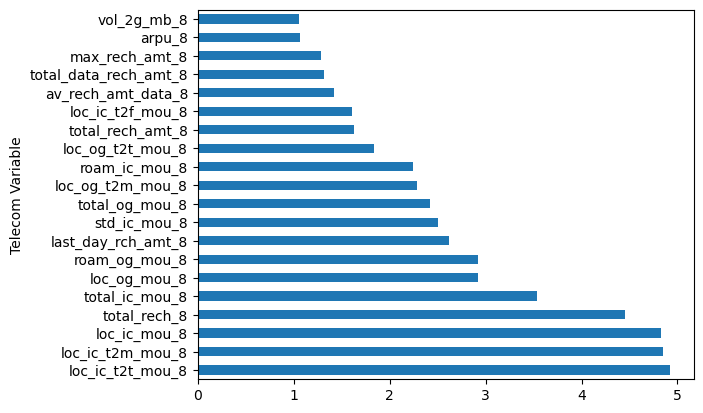

In [182]:
#plotting bar graph for top 20 features

telecom_feature_importance_top['Importance Percentage'].head(20).plot(kind='barh')

# Business Insights

1. Company should work on action phase data

2. Company should introduce cheaper 3g data package, as we can see there are people which are hooked on 2G plans and not churing.

3. Company need to come up with campaigns that would keep people engaged either via calls (incoming) or on internet. 

3. The customers should be given good options for roaming.

4. Good packages should be introducted. Company should reduce the rates of outgoing calls.

5. Company should contact the customer on timely basis to understand their problems and to get service feedback. 

- In this way company can avoid churns.